# ECG Image Heart Disease Classification & Clinical Safety Pipeline

## Project Overview
This project develops an end-to-end deep learning pipeline that classifies a **12-lead ECG printout** into four diagnostic categories: **Abnormal Heartbeat, History of MI, Myocardial Infarction, and Normal**.

The data is the *ECG Images dataset of Cardiac Patients* (Ch. Pervaiz Elahi Institute of Cardiology, Multan; Khan & Hussain, Mendeley Data v2, CC BY 4.0). Like the lung X-ray module, the notebook is built around **clinical safety and explainability**:

* **Leakage-free data:** The published dataset contains 437 exact duplicate files (only 30 distinct Myocardial Infarction ECGs among 239 files). They are removed *before* splitting, and the printout header (patient ID, date, heart rate) is cropped away so the models can only learn from the waveforms.
* **Transfer Learning:** Two-phase training and fine-tuning of DenseNet121, ResNet50V2 and EfficientNetB0 against a Custom CNN baseline, each fed with the input scaling its ImageNet weights expect.
* **Ensemble Methods:** A soft-voting ensemble across the pre-trained models.
* **Explainable AI (XAI):** **Grad-CAM heatmaps** to check that predictions come from the ECG traces rather than the grid, lead labels or calibration pulses.
* **Clinical Safety Layer:** A nearest-neighbour Out-of-Distribution (OOD) gate on the model's embeddings that rejects inputs that are not ECG printouts, plus a confidence threshold that flags uncertain cases for cardiologist review.

# Import Libraries

In [1]:
import os
# Keras 3 runs on the PyTorch backend here: TensorFlow has no GPU support on native Windows,
# PyTorch does. This must be set before keras is imported.
os.environ['KERAS_BACKEND'] = 'torch'

import gc
import json
import random
import time
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import torch
import keras
from keras import layers

from sklearn.metrics import (classification_report, confusion_matrix, accuracy_score,
                             f1_score, roc_auc_score, log_loss)

warnings.filterwarnings('ignore', category=FutureWarning)   # third-party deprecation notices

SEED = 42
keras.utils.set_random_seed(SEED)   # seeds Python, NumPy and PyTorch

device_name = torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU only'
print(f"Keras {keras.__version__} | backend: {keras.backend.backend()} | device: {device_name}")
print("Libraries imported successfully!")

Keras 3.14.1 | backend: torch | device: NVIDIA GeForce RTX 5060
Libraries imported successfully!


In [2]:
# Project folders (the notebook runs from heart/image_based/notebook/)
base_dir = Path('../data')
train_dir = base_dir / 'train'
val_dir = base_dir / 'val'
test_dir = base_dir / 'test'

MODELS_DIR = Path('../models')
IMAGES_DIR = Path('../images')
RESULTS_DIR = Path('../results')
for d in (MODELS_DIR, IMAGES_DIR, RESULTS_DIR):
    d.mkdir(exist_ok=True)

class_names = [
    'Abnormal_Heartbeat',
    'History_of_MI',
    'Myocardial_Infarction',
    'Normal'
]
num_classes = len(class_names)

for path_name, dir_path in zip(['Train', 'Test', 'Validation'], [train_dir, test_dir, val_dir]):
    if dir_path.exists():
        print(f"✅ {path_name} directory found.")
    else:
        print(f"❌ {path_name} directory NOT found. Run `python data/build_ecg_dataset.py` first.")

✅ Train directory found.
✅ Test directory found.
✅ Validation directory found.


# Dataset Audit (Duplicates & Leakage)

### Why the Raw Dataset Cannot Be Used As-Is
The Mendeley download has 928 files, but many are byte-for-byte copies of each other. A random split of the raw folders would put copies of the same ECG in both train and test, and the test score would measure memorisation. `data/build_ecg_dataset.py` therefore:

1. Keeps one file per unique MD5 hash (no near-duplicates remain: the highest pixel correlation between two different kept ECGs is 0.76).
2. Crops each printout to the ECG grid, removing the header (patient ID, recording date/time, heart rate) and footer (timestamp).
3. Makes a stratified 70 / 15 / 15 train / validation / test split of the unique ECGs.

`manifest.csv` records, for every kept image, its split and the duplicate files that were dropped.

,raw_files,unique_ecgs,duplicate_files,duplicate_%
label,,,,
Abnormal_Heartbeat,233.0,233.0,0.0,0.0
History_of_MI,172.0,86.0,86.0,50.0
Myocardial_Infarction,239.0,30.0,209.0,87.4
Normal,284.0,142.0,142.0,50.0
Total,928.0,491.0,437.0,47.1


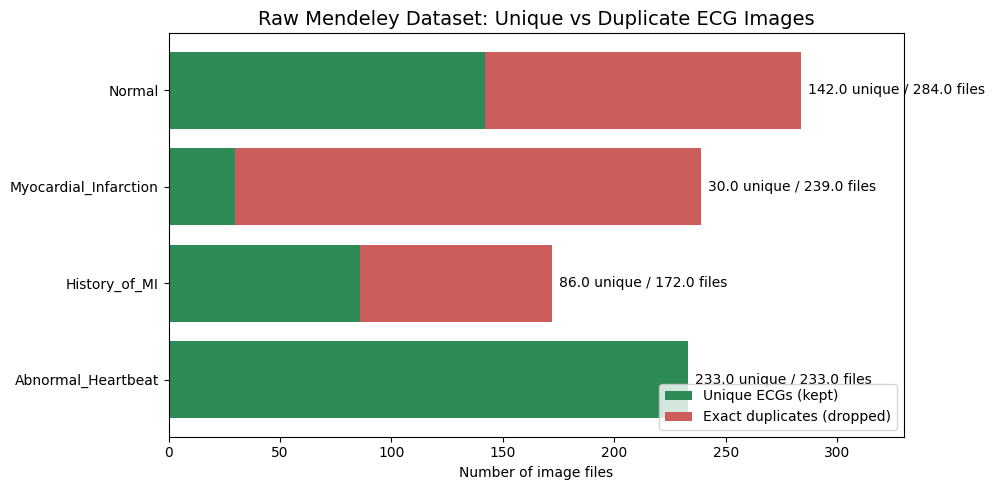

In [3]:
manifest = pd.read_csv(base_dir / 'manifest.csv')
manifest['n_copies'] = manifest['duplicates'].fillna('').apply(lambda s: len(s.split(';')) if s else 0)

audit = manifest.groupby('label').agg(unique_ecgs=('md5', 'size'), duplicate_files=('n_copies', 'sum'))
audit['raw_files'] = audit['unique_ecgs'] + audit['duplicate_files']
audit['duplicate_%'] = (100 * audit['duplicate_files'] / audit['raw_files']).round(1)
audit = audit[['raw_files', 'unique_ecgs', 'duplicate_files', 'duplicate_%']]
audit.loc['Total'] = audit.sum(numeric_only=True)
audit.loc['Total', 'duplicate_%'] = round(100 * audit.loc['Total', 'duplicate_files'] / audit.loc['Total', 'raw_files'], 1)
display(audit)

fig, ax = plt.subplots(figsize=(10, 5))
plot_df = audit.drop('Total')
ax.barh(plot_df.index, plot_df['unique_ecgs'], color='seagreen', label='Unique ECGs (kept)')
ax.barh(plot_df.index, plot_df['duplicate_files'], left=plot_df['unique_ecgs'], color='indianred', label='Exact duplicates (dropped)')
for i, (u, d) in enumerate(zip(plot_df['unique_ecgs'], plot_df['duplicate_files'])):
    ax.text(u + d + 3, i, f'{u} unique / {u + d} files', va='center')
ax.set_xlabel('Number of image files')
ax.set_title('Raw Mendeley Dataset: Unique vs Duplicate ECG Images', fontsize=14)
ax.set_xlim(0, 330)
ax.legend(loc='lower right')
plt.tight_layout()
plt.savefig(IMAGES_DIR / 'duplicate_audit.png', dpi=120, bbox_inches='tight')
plt.show()

# Image Visualization

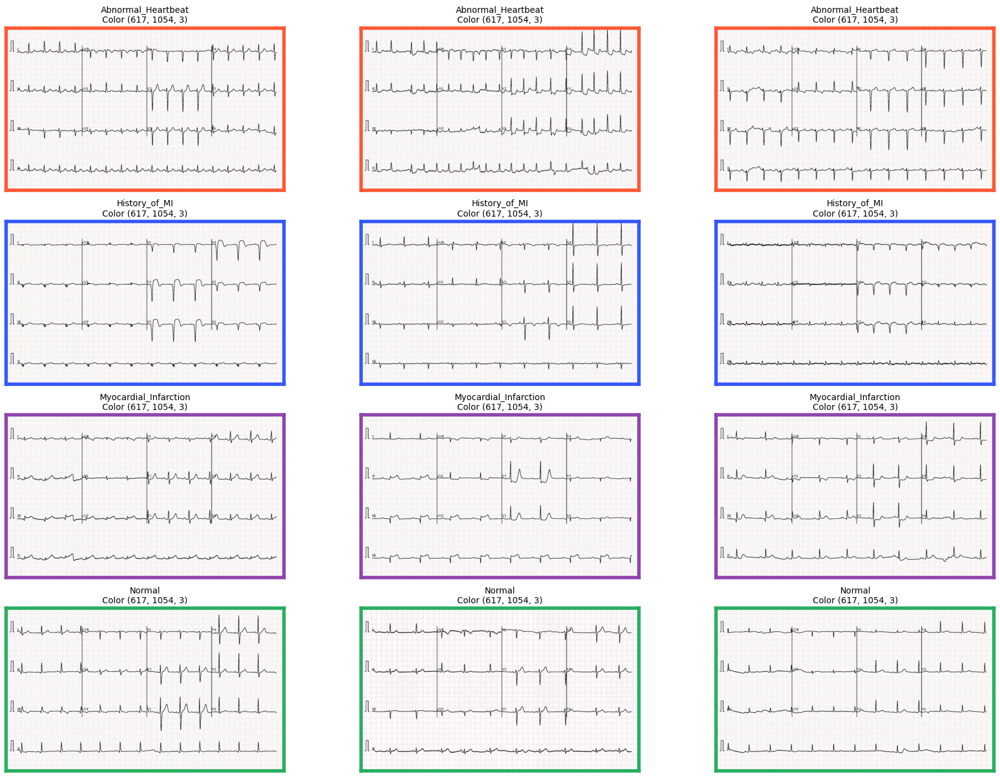

In [4]:
# 4 classes x 3 random samples from the training set
num_samples = 3

fig, axes = plt.subplots(num_classes, num_samples, figsize=(18, 3.2 * num_classes))

# Define a distinct color for each class
border_colors = ['#FF5733', '#3357FF', '#8E44AD', '#27AE60']

for i, class_name in enumerate(class_names):
    class_dir = train_dir / class_name
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_images = random.sample(images, min(num_samples, len(images)))
    color = border_colors[i % len(border_colors)]

    for j, img_name in enumerate(selected_images):
        # Read with original channels to check color vs grayscale
        img = cv2.imread(str(class_dir / img_name), cv2.IMREAD_UNCHANGED)
        shape = img.shape
        color_type = 'Grayscale' if len(shape) == 2 else 'Color'
        img_disp = img if len(shape) == 2 else cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ax = axes[i, j]
        ax.imshow(img_disp, cmap='gray' if len(shape) == 2 else None)
        ax.set_title(f"{class_name}\n{color_type} {shape}", fontsize=10)

        # Remove ticks but keep a colored border per class
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(4)

plt.tight_layout()
plt.savefig(IMAGES_DIR / 'sample_images.png', dpi=100, bbox_inches='tight')
plt.show()

# Image Statistics and EDA

### Item Count

In [5]:
counts_data = []

for split_name, split_dir in zip(['Train', 'Test', 'Validation'], [train_dir, test_dir, val_dir]):
    for class_name in class_names:
        class_dir = split_dir / class_name
        num_items = len([f for f in os.listdir(class_dir) if (class_dir / f).is_file()]) if class_dir.exists() else 0
        counts_data.append({'Split': split_name, 'Class': class_name, 'Count': num_items})

df_counts = pd.DataFrame(counts_data)

# Pivot so Splits are columns and Classes are rows
df_pivot = df_counts.pivot(index='Class', columns='Split', values='Count').fillna(0).astype(int)
df_pivot = df_pivot[['Train', 'Validation', 'Test']]

# Add Total row and column
df_pivot['Total'] = df_pivot.sum(axis=1)
df_pivot.loc['Total'] = df_pivot.sum(axis=0)

print("Number of items in each folder:")
display(df_pivot)

Number of items in each folder:


Split,Train,Validation,Test,Total
Class,,,,
Abnormal_Heartbeat,163,35,35,233
History_of_MI,60,13,13,86
Myocardial_Infarction,21,5,4,30
Normal,99,21,22,142
Total,343,74,74,491


### Target Distribution

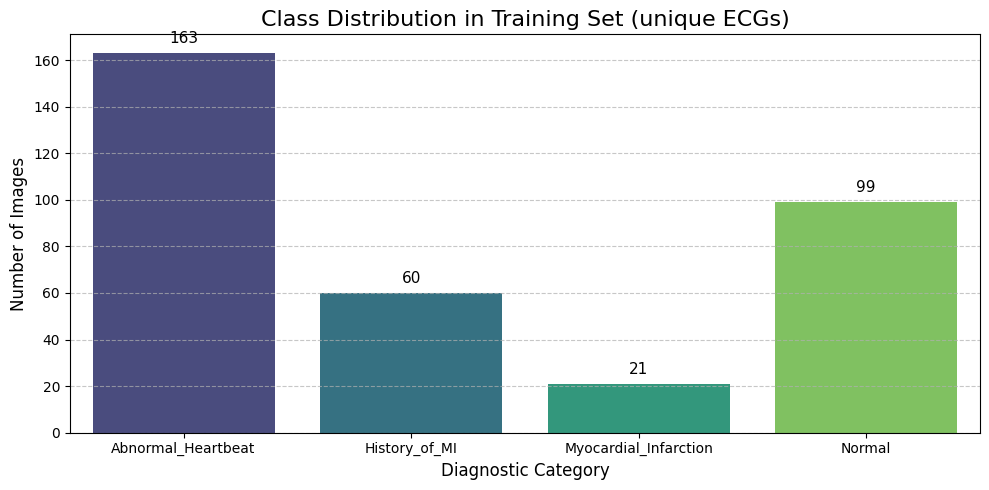

In [6]:
train_counts = df_counts[df_counts['Split'] == 'Train']

plt.figure(figsize=(10, 5))
ax = sns.barplot(data=train_counts, x='Class', y='Count', hue='Class', palette='viridis', legend=False)

plt.title('Class Distribution in Training Set (unique ECGs)', fontsize=16)
plt.xlabel('Diagnostic Category', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)

# Value labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=11, color='black',
                xytext=(0, 5), textcoords='offset points')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(IMAGES_DIR / 'class_distribution.png', dpi=120, bbox_inches='tight')
plt.show()

### Prepare Before EDA

In [7]:
from tqdm.notebook import tqdm

EDA_SIZE = (448, 256)   # (width, height) for the mean image

image_shapes = {}
mean_images = {}
pixel_intensities = {}

print("Processing images for EDA...")
for class_name in tqdm(class_names, desc="Classes"):
    class_dir = train_dir / class_name
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    shapes, pixels = [], []
    mean_img = np.zeros((EDA_SIZE[1], EDA_SIZE[0]), dtype=np.float32)

    # The training set is small (343 images), so every image is used
    for img_name in images:
        img_path = class_dir / img_name
        with Image.open(img_path) as img:
            shapes.append(img.size)   # (width, height)

        img_cv = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        pixels.extend(img_cv.flatten()[::20])   # subsample pixels for the histogram
        mean_img += cv2.resize(img_cv, EDA_SIZE, interpolation=cv2.INTER_AREA)

    image_shapes[class_name] = shapes
    mean_images[class_name] = mean_img / len(images)
    pixel_intensities[class_name] = pixels

print("\nEDA Data Collection Complete!")

Processing images for EDA...


Classes:   0%|          | 0/4 [00:00<?, ?it/s]


EDA Data Collection Complete!


# Resize

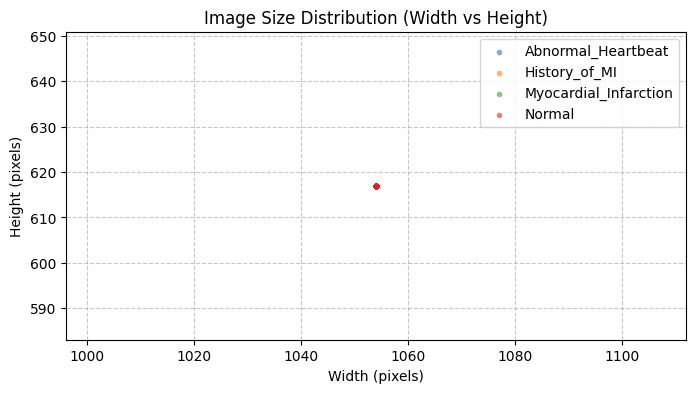


--- Sizing Analysis ---
Found 1 unique image size(s).
➡️ CONCLUSION: All images are 1054x617 (aspect 1.71:1). They are resized to 448x256 so the wide 12-lead layout is not squashed into a square.


In [8]:
plt.figure(figsize=(8, 4))
all_shapes = []

for class_name, shapes in image_shapes.items():
    all_shapes.extend(shapes)
    plt.scatter([s[0] for s in shapes], [s[1] for s in shapes], label=class_name, alpha=0.5, marker='.')

plt.title('Image Size Distribution (Width vs Height)')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

unique_shapes = set(all_shapes)
print(f"\n--- Sizing Analysis ---")
print(f"Found {len(unique_shapes)} unique image size(s).")
if len(unique_shapes) > 1:
    print("➡️ CONCLUSION: Resizing IS REQUIRED for model training, as images vary in size.")
else:
    w, h = list(unique_shapes)[0]
    print(f"➡️ CONCLUSION: All images are {w}x{h} (aspect {w / h:.2f}:1). They are resized to 448x256 "
          f"so the wide 12-lead layout is not squashed into a square.")

### Mean Image & Pixel Intensity Histogram

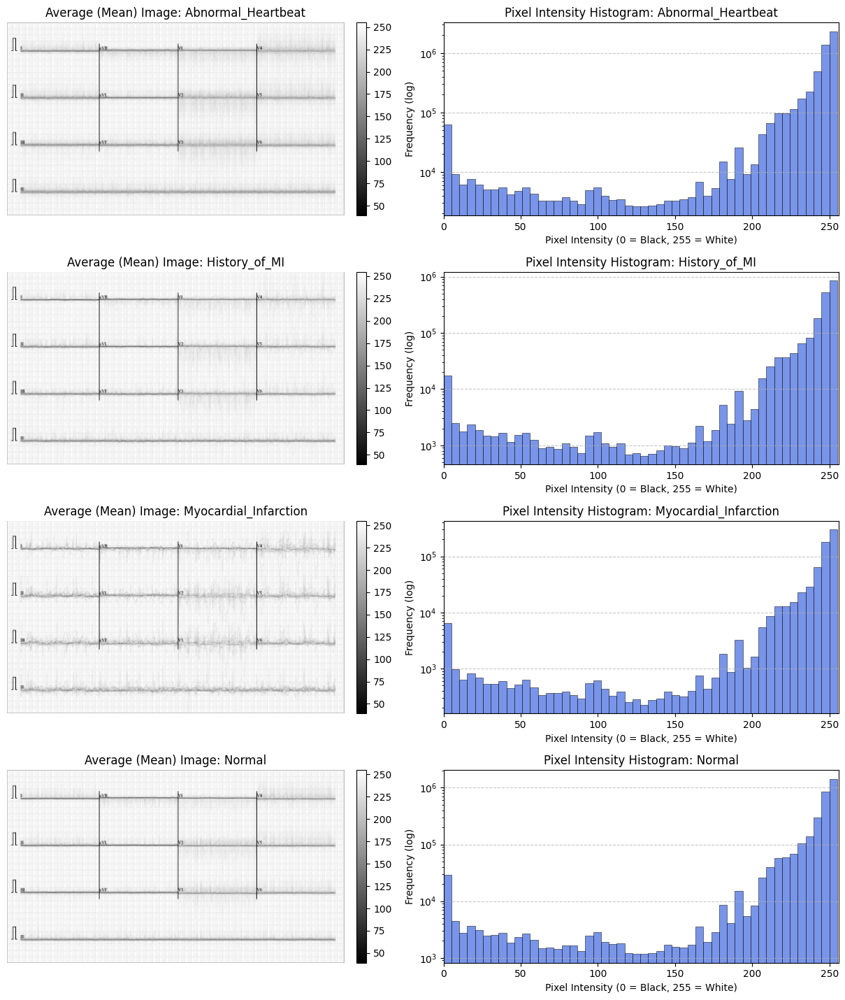

In [9]:
fig, axes = plt.subplots(num_classes, 2, figsize=(16, 3.6 * num_classes),
                         gridspec_kw={'width_ratios': [1.6, 1]})

for i, class_name in enumerate(class_names):
    # A. Mean Image
    ax_img = axes[i, 0]
    im = ax_img.imshow(mean_images[class_name], cmap='gray')
    ax_img.set_title(f'Average (Mean) Image: {class_name}', fontsize=12)
    ax_img.axis('off')
    fig.colorbar(im, ax=ax_img, fraction=0.03, pad=0.02)

    # B. Pixel Intensity Histogram (log scale: the page is mostly white background)
    ax_hist = axes[i, 1]
    ax_hist.hist(pixel_intensities[class_name], bins=50, color='royalblue', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax_hist.set_yscale('log')
    ax_hist.set_title(f'Pixel Intensity Histogram: {class_name}', fontsize=12)
    ax_hist.set_xlabel('Pixel Intensity (0 = Black, 255 = White)')
    ax_hist.set_ylabel('Frequency (log)')
    ax_hist.set_xlim([0, 256])
    ax_hist.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig(IMAGES_DIR / 'mean_image_pixel_histogram.png', dpi=100, bbox_inches='tight')
plt.show()

* **Mean Images (Visual Patterns):** Every printout uses the same template, so the grid, the four lead rows, the lead-separator lines and the calibration pulses at the left edge line up exactly and stay sharp in the average. The waveforms themselves blur, because heart rate and beat timing differ from patient to patient. The fixed layout is useful (each lead is always in the same place), but it also means the template alone carries no diagnostic information.
* **Class differences:** The Myocardial Infarction mean is visibly "noisier" around the baselines, especially in the chest leads (V1–V6, right half), because large ST-segment shifts and deep Q waves spread ink above and below the baseline. The other three class means look very similar, which is an early hint that separating them depends on fine waveform detail.
* **Pixel Intensities:** Almost all pixels are near-white paper (note the log scale). The traces are a thin band of dark pixels at 0–50 and the pink grid sits around 180–240. This is why the images are downsampled with area (BOX) resampling, which keeps thin dark lines visible instead of skipping over them.

# Data Preprocessing

### Loading the Images
The whole dataset is 491 images, so it is loaded into memory once as `uint8` arrays (~160 MB) instead of being streamed from disk. `load_image()` is the **only** preprocessing done outside the models: RGB → 448×256 → float 0–255. Each model scales the pixels itself (see Model Building), so a saved checkpoint needs nothing else at inference.

A full, uncropped printout (2213×1572, header included) is cropped to the ECG grid first, exactly like `build_ecg_dataset.py` does.

In [10]:
IMG_SIZE = (256, 448)          # (height, width): keeps the ~1.7:1 printout aspect ratio
BATCH_SIZE = 8

# Same constants as data/build_ecg_dataset.py
PRINTOUT_SIZE = (2213, 1572)
GRID_BOX = (68, 283, 2177, 1518)


def load_image(source, target_size=IMG_SIZE):
    """Path / PIL image -> float32 array (H, W, 3) in 0-255. Crops raw printouts to the ECG grid."""
    img = source if isinstance(source, Image.Image) else Image.open(source)
    img = img.convert('RGB')
    if img.size == PRINTOUT_SIZE:
        img = img.crop(GRID_BOX)
    # BOX (area) resampling keeps the thin ECG traces visible when shrinking
    img = img.resize((target_size[1], target_size[0]), Image.BOX)
    return np.asarray(img, dtype=np.float32)


def load_split(split_dir):
    paths, labels = [], []
    for idx, class_name in enumerate(class_names):
        for f in sorted(os.listdir(split_dir / class_name)):
            paths.append(split_dir / class_name / f)
            labels.append(idx)
    X = np.stack([load_image(p).astype(np.uint8) for p in paths])
    return X, np.array(labels), paths


print("Loading Training Data...")
X_train, y_train, train_paths = load_split(train_dir)
print(f"Found {len(X_train)} images belonging to {num_classes} classes.")

print("\nLoading Validation Data...")
X_val, y_val, val_paths = load_split(val_dir)
print(f"Found {len(X_val)} images belonging to {num_classes} classes.")

print("\nLoading Test Data...")
X_test, y_test, test_paths = load_split(test_dir)
print(f"Found {len(X_test)} images belonging to {num_classes} classes.")

Y_train = keras.utils.to_categorical(y_train, num_classes)
Y_val = keras.utils.to_categorical(y_val, num_classes)
Y_test = keras.utils.to_categorical(y_test, num_classes)
X_val_f, X_test_f = X_val.astype('float32'), X_test.astype('float32')
print(f"\nTrain array: {X_train.shape}, {X_train.nbytes / 1e6:.0f} MB")

Loading Training Data...


Found 343 images belonging to 4 classes.

Loading Validation Data...


Found 74 images belonging to 4 classes.

Loading Test Data...


Found 74 images belonging to 4 classes.

Train array: (343, 256, 448, 3), 118 MB


### Data Augmentation Setup
ECG-safe augmentation only: small rotation (±1.8°), zoom (±5%), shift (±3%), contrast and brightness changes. These mimic a slightly skewed scan or a different printer.

**No flipping:** a horizontal flip reverses time and a vertical flip inverts every wave, so both would create ECGs that cannot exist.

In [11]:
data_augmentation = keras.Sequential([
    layers.RandomRotation(0.005, fill_mode='constant', fill_value=255.0),
    layers.RandomZoom((-0.05, 0.05), fill_mode='constant', fill_value=255.0),
    layers.RandomTranslation(0.03, 0.03, fill_mode='constant', fill_value=255.0),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.1, value_range=(0, 255)),
], name='ecg_augmentation')


class ECGSequence(keras.utils.PyDataset):
    """Batches from in-memory arrays, augmented on the fly (training set only)."""

    def __init__(self, X, Y, batch_size=BATCH_SIZE, augment=False, shuffle=False, **kwargs):
        super().__init__(**kwargs)
        self.X, self.Y = X, Y
        self.batch_size, self.augment, self.shuffle = batch_size, augment, shuffle
        self.indices = np.arange(len(X))
        if shuffle:
            np.random.shuffle(self.indices)

    def __len__(self):
        return int(np.ceil(len(self.X) / self.batch_size))

    def __getitem__(self, idx):
        ids = self.indices[idx * self.batch_size:(idx + 1) * self.batch_size]
        xb = self.X[ids].astype('float32')
        if self.augment:
            xb = keras.ops.convert_to_numpy(data_augmentation(xb, training=True))
        return np.clip(xb, 0, 255), self.Y[ids]

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)


train_generator = ECGSequence(X_train, Y_train, augment=True, shuffle=True)
print(f"Training batches per epoch: {len(train_generator)}")

Training batches per epoch: 43


### Class Indices Mapping

In [12]:
# Mapping of class names to their numerical indices
class_indices = {name: i for i, name in enumerate(class_names)}
print("Class Indices Mapping:")
print(class_indices)

Class Indices Mapping:
{'Abnormal_Heartbeat': 0, 'History_of_MI': 1, 'Myocardial_Infarction': 2, 'Normal': 3}


### Augmented Sample Preview
Verify that the augmentation produces realistic ECG printouts and does not cut off leads.

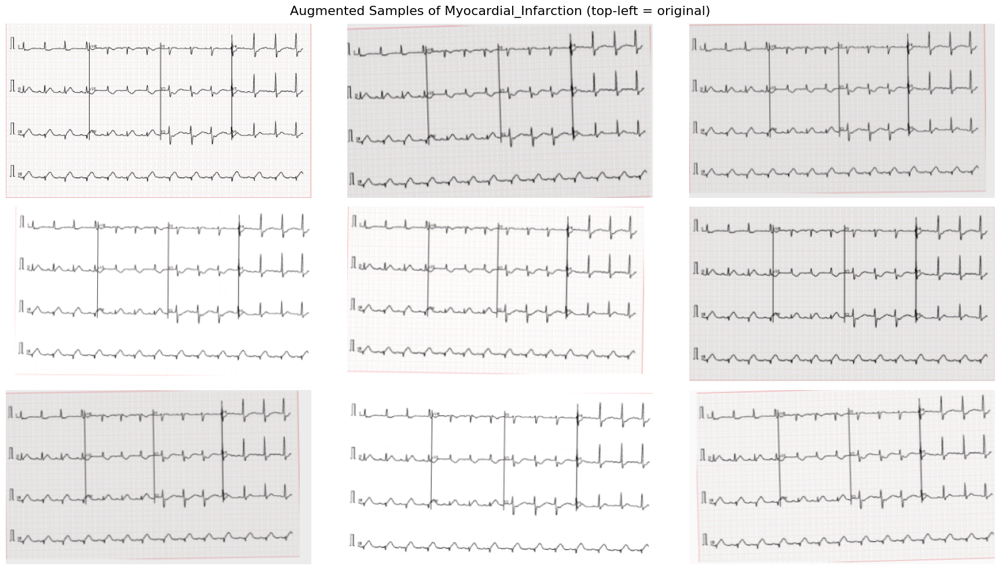

In [13]:
sample_class = 'Myocardial_Infarction'
sample_idx = np.where(y_train == class_indices[sample_class])[0][0]
img_array = np.repeat(X_train[sample_idx:sample_idx + 1].astype('float32'), 9, axis=0)
aug_imgs = np.clip(keras.ops.convert_to_numpy(data_augmentation(img_array, training=True)), 0, 255)

fig, axes = plt.subplots(3, 3, figsize=(18, 10))
fig.suptitle(f'Augmented Samples of {sample_class} (top-left = original)', fontsize=16)

for i, ax in enumerate(axes.flat):
    ax.imshow((img_array[0] if i == 0 else aug_imgs[i]).astype('uint8'))
    ax.axis('off')

plt.tight_layout()
plt.savefig(IMAGES_DIR / 'augmented_samples.png', dpi=90, bbox_inches='tight')
plt.show()

The transformations (slight rotation, zoom, shift, contrast and brightness change) produce variants that look like the same ECG scanned or photographed slightly differently. All 12 leads stay inside the frame and the waveform shapes are unchanged, so the diagnosis is preserved while the model cannot memorise exact pixel positions.

### Class Imbalance Handling (Class Weights)
Unlike the lung X-ray data, this dataset is clearly imbalanced after de-duplication: Myocardial Infarction has only 21 training ECGs against 163 for Abnormal Heartbeat. Balanced class weights make a mistake on a rare class cost proportionally more.

In [14]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(class_weight='balanced', classes=np.arange(num_classes), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

print("Class Weights mapped to indices:")
for class_idx, weight in class_weight_dict.items():
    print(f"{class_names[class_idx]:22s} (Index {class_idx}): {weight:.4f}")

Class Weights mapped to indices:
Abnormal_Heartbeat     (Index 0): 0.5261
History_of_MI          (Index 1): 1.4292
Myocardial_Infarction  (Index 2): 4.0833
Normal                 (Index 3): 0.8662


* **Strong imbalance:** Myocardial Infarction gets a weight of **4.08**. It has only 21 training ECGs, so each of its mistakes counts about 8× more than one on Abnormal Heartbeat (**0.53**, the largest class with 163 ECGs).
* **History of MI (1.43)** is also up-weighted, and **Normal (0.87)** is close to neutral.
* Without these weights, a model could reach ~48% training accuracy by always answering "Abnormal Heartbeat" and would have little reason to learn the rare MI pattern.

# Model Building

Same four architectures as the lung module: a **Custom CNN** baseline from scratch plus ImageNet-pretrained **ResNet, EfficientNetB0 and DenseNet121**. Bigger variants (EfficientNetB7, DenseNet201, ConvNeXt) were not used: with 343 training images they would overfit faster, cost far more compute, and add little.

**Input scaling fix.** In the lung notebook every model received pixels divided by 255. That silently broke EfficientNetB0 (it already rescales internally and expects 0–255, so it saw near-black images and stayed at chance) and slowed ResNet50 (it expects caffe-style BGR mean subtraction). Here every model receives **raw 0–255 pixels** and applies its own preprocessing as its first layers:

| Model | In-model preprocessing |
|---|---|
| Custom CNN | `Rescaling(1/255)` |
| ResNet50V2 | `Rescaling(1/127.5, offset=-1)` → [-1, 1] |
| EfficientNetB0 | none (built in) |
| DenseNet121 | `Rescaling(1/255)` + ImageNet mean/std `Normalization` |

ResNet50**V2** replaces ResNet50 because V2's [-1, 1] scaling can be done with a standard layer, while ResNet50's RGB→BGR channel swap would need a `Lambda` layer, and a `.keras` file with a `Lambda` cannot be loaded in safe mode.

### Custom CNN Baseline

In [15]:
INPUT_SHAPE = IMG_SIZE + (3,)

# Four conv blocks + global average pooling. (A Flatten head as in the lung notebook
# would have ~60M weights at 256x448 input, far too many for 343 training images.)
# BatchNorm momentum 0.9 instead of 0.99: with only 43 steps per epoch the default
# running statistics lag far behind the weights and validation predictions collapse.
custom_cnn = keras.Sequential([
    keras.Input(shape=INPUT_SHAPE),
    layers.Rescaling(1. / 255),
    layers.Conv2D(32, 3, activation='relu', padding='same'),
    layers.BatchNormalization(momentum=0.9),
    layers.MaxPooling2D(2),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.BatchNormalization(momentum=0.9),
    layers.MaxPooling2D(2),
    layers.Conv2D(128, 3, activation='relu', padding='same'),
    layers.BatchNormalization(momentum=0.9),
    layers.MaxPooling2D(2),
    layers.Conv2D(256, 3, activation='relu', padding='same'),
    layers.BatchNormalization(momentum=0.9),
    layers.MaxPooling2D(2),
    layers.GlobalAveragePooling2D(name='gap'),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(num_classes, activation='softmax')
], name='Custom_CNN')

print("Custom CNN Baseline Summary:")
custom_cnn.summary()

Custom CNN Baseline Summary:


Model: "Custom_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 448, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 448, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 224, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 112, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 112, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 112, 128)   │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 16, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 423,748 (1.62 MB)

 Trainable params: 422,788 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

### Transfer-Learning Builder
All three pre-trained models share the same head as the lung module: `GlobalAveragePooling2D → Dense(256) → Dropout(0.4) → Dense(4, softmax)`. The backbone is called with `training=False`, so its BatchNorm layers keep their ImageNet statistics even after unfreezing; updating them from batches of 8 ECGs would wreck them.

In [16]:
def build_transfer_model(name, backbone_fn, preprocessing):
    backbone = backbone_fn(weights='imagenet', include_top=False, input_shape=INPUT_SHAPE)
    backbone.trainable = False   # Phase 1: train only the new head

    inputs = keras.Input(shape=INPUT_SHAPE, name='ecg_image')
    x = inputs
    for layer in preprocessing:
        x = layer(x)
    x = backbone(x, training=False)
    x = layers.GlobalAveragePooling2D(name='gap')(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    return keras.Model(inputs, outputs, name=name), backbone


def get_backbone(model):
    """The nested pre-trained model inside a transfer model (None for the Custom CNN)."""
    return next((l for l in model.layers if isinstance(l, keras.Model)), None)

### ResNet50V2

In [17]:
resnet_model, resnet_base = build_transfer_model(
    'ResNet50V2', keras.applications.ResNet50V2,
    [layers.Rescaling(1. / 127.5, offset=-1)])

print("ResNet50V2 Summary:")
resnet_model.summary()

ResNet50V2 Summary:


Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ ecg_image (InputLayer)          │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 8, 14, 2048)    │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,090,372 (91.90 MB)

 Trainable params: 525,572 (2.00 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

### EfficientNetB0

In [18]:
# EfficientNetB0 already contains Rescaling + Normalization and expects 0-255 input
effnet_model, effnet_base = build_transfer_model(
    'EfficientNetB0', keras.applications.EfficientNetB0, [])

print("EfficientNetB0 Summary:")
effnet_model.summary()

EfficientNetB0 Summary:


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ ecg_image (InputLayer)          │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 8, 14, 1280)    │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,378,535 (16.70 MB)

 Trainable params: 328,964 (1.25 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

### DenseNet121

In [19]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

densenet_model, densenet_base = build_transfer_model(
    'DenseNet121', keras.applications.DenseNet121,
    [layers.Rescaling(1. / 255),
     layers.Normalization(mean=IMAGENET_MEAN, variance=[s ** 2 for s in IMAGENET_STD])])

print("DenseNet121 Summary:")
densenet_model.summary()

DenseNet121 Summary:


Model: "DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ ecg_image (InputLayer)          │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_4 (Rescaling)         │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization_1 (Normalization) │ (None, 256, 448, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet121 (Functional)        │ (None, 8, 14, 1024)    │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,300,932 (27.85 MB)

 Trainable params: 263,428 (1.00 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

# Model Training

### Callbacks Setup

In [20]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Each model gets its own checkpoint file in ../models
def get_callbacks(model_name):
    checkpoint_path = MODELS_DIR / f'{model_name}_best.keras'
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=10,    # stop if no improvement for 10 epochs (validation is small and noisy)
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.3,
            patience=4,
            verbose=1
        ),
        ModelCheckpoint(
            str(checkpoint_path),
            monitor='val_loss',
            save_best_only=True,
            verbose=0
        )
    ]

* **EarlyStopping** stops training once validation loss has not improved for 10 epochs and restores the best weights.
* **ReduceLROnPlateau** shrinks the learning rate when validation loss stops improving.
* **ModelCheckpoint** keeps the best epoch on disk. It monitors `val_loss` rather than `val_accuracy`: with 74 validation images, accuracy moves in steps of 1.4% and ties often, while the loss still separates a confident correct model from a lucky one.

### Train All Models (Phase 1: Initial Training)
The backbones are frozen and only the heads learn, at a learning rate of 1e-3. That is 10× the lung notebook's rate, because an epoch here is 43 steps instead of 455.

**Resumable:** a model whose checkpoint already exists is loaded instead of retrained, so a crash or reboot costs one model, not the whole run. Start Jupyter with the environment variable `RETRAIN=1` to train everything from scratch.

In [21]:
from keras.optimizers import Adam

# Set the RETRAIN=1 environment variable to retrain even when checkpoints exist
RETRAIN = os.environ.get('RETRAIN', '0') == '1'
INITIAL_EPOCHS = 40
HISTORY_PATH = RESULTS_DIR / 'training_history.json'

models_dict = {
    'Custom_CNN': custom_cnn,
    'ResNet50V2': resnet_model,
    'EfficientNetB0': effnet_model,
    'DenseNet121': densenet_model
}

# Training history is kept on disk so the plots survive a kernel restart
history_dict = json.loads(HISTORY_PATH.read_text()) if HISTORY_PATH.exists() and not RETRAIN else {}

for name, model in models_dict.items():
    ckpt = MODELS_DIR / f'{name}_best.keras'
    if ckpt.exists() and not RETRAIN:
        model.load_weights(ckpt)
        print(f"⏭️  {name}: checkpoint found, weights loaded (Phase 1 skipped)")
        continue

    print(f"\n{'=' * 50}\nTraining {name} - Phase 1\n{'=' * 50}")
    model.compile(optimizer=Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

    start = time.time()
    history = model.fit(
        train_generator,
        validation_data=(X_val_f, Y_val),
        validation_batch_size=BATCH_SIZE,
        epochs=INITIAL_EPOCHS,
        class_weight=class_weight_dict,
        callbacks=get_callbacks(name),
        verbose=2
    )
    history_dict[f'{name}_phase1'] = {k: [float(v) for v in vals] for k, vals in history.history.items()}
    HISTORY_PATH.write_text(json.dumps(history_dict))
    print(f"{name} Phase 1 finished in {time.time() - start:.0f}s")
    gc.collect()
    torch.cuda.empty_cache()   # free GPU memory before the next model


Training Custom_CNN - Phase 1
Epoch 1/40


43/43 - 4s - 101ms/step - accuracy: 0.3819 - loss: 1.5137 - val_accuracy: 0.3108 - val_loss: 1.8376 - learning_rate: 0.0010


Epoch 2/40


43/43 - 4s - 90ms/step - accuracy: 0.3732 - loss: 1.3717 - val_accuracy: 0.4730 - val_loss: 2.0095 - learning_rate: 0.0010


Epoch 3/40


43/43 - 4s - 90ms/step - accuracy: 0.4577 - loss: 1.2758 - val_accuracy: 0.4730 - val_loss: 4.3672 - learning_rate: 0.0010


Epoch 4/40


43/43 - 4s - 91ms/step - accuracy: 0.5248 - loss: 1.2048 - val_accuracy: 0.0676 - val_loss: 1.9159 - learning_rate: 0.0010


Epoch 5/40


43/43 - 4s - 91ms/step - accuracy: 0.5335 - loss: 1.2385 - val_accuracy: 0.3514 - val_loss: 1.2284 - learning_rate: 0.0010


Epoch 6/40


43/43 - 4s - 91ms/step - accuracy: 0.5860 - loss: 1.0885 - val_accuracy: 0.7027 - val_loss: 0.7626 - learning_rate: 0.0010


Epoch 7/40


43/43 - 4s - 91ms/step - accuracy: 0.5131 - loss: 1.2460 - val_accuracy: 0.1216 - val_loss: 1.5329 - learning_rate: 0.0010


Epoch 8/40


43/43 - 4s - 90ms/step - accuracy: 0.5714 - loss: 1.1439 - val_accuracy: 0.0676 - val_loss: 1.6970 - learning_rate: 0.0010


Epoch 9/40


43/43 - 4s - 91ms/step - accuracy: 0.5889 - loss: 1.0915 - val_accuracy: 0.5541 - val_loss: 0.9974 - learning_rate: 0.0010


Epoch 10/40



Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.


43/43 - 4s - 91ms/step - accuracy: 0.6385 - loss: 1.0425 - val_accuracy: 0.2838 - val_loss: 2.8885 - learning_rate: 0.0010


Epoch 11/40


43/43 - 4s - 91ms/step - accuracy: 0.6531 - loss: 0.9915 - val_accuracy: 0.5946 - val_loss: 1.0218 - learning_rate: 3.0000e-04


Epoch 12/40


43/43 - 4s - 90ms/step - accuracy: 0.6676 - loss: 0.9765 - val_accuracy: 0.5811 - val_loss: 0.9424 - learning_rate: 3.0000e-04


Epoch 13/40


43/43 - 4s - 91ms/step - accuracy: 0.6414 - loss: 0.9350 - val_accuracy: 0.2973 - val_loss: 2.4350 - learning_rate: 3.0000e-04


Epoch 14/40



Epoch 14: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.


43/43 - 4s - 91ms/step - accuracy: 0.6822 - loss: 0.8788 - val_accuracy: 0.2838 - val_loss: 4.8932 - learning_rate: 3.0000e-04


Epoch 15/40


43/43 - 4s - 90ms/step - accuracy: 0.6910 - loss: 0.8399 - val_accuracy: 0.7297 - val_loss: 0.7940 - learning_rate: 9.0000e-05


Epoch 16/40


43/43 - 4s - 91ms/step - accuracy: 0.7143 - loss: 0.8252 - val_accuracy: 0.5811 - val_loss: 1.0142 - learning_rate: 9.0000e-05


Epoch 16: early stopping


Restoring model weights from the end of the best epoch: 6.


Custom_CNN Phase 1 finished in 63s



Training ResNet50V2 - Phase 1
Epoch 1/40


43/43 - 5s - 122ms/step - accuracy: 0.4023 - loss: 1.5081 - val_accuracy: 0.1216 - val_loss: 1.8096 - learning_rate: 0.0010


Epoch 2/40


43/43 - 5s - 120ms/step - accuracy: 0.5335 - loss: 1.1712 - val_accuracy: 0.4189 - val_loss: 1.1461 - learning_rate: 0.0010


Epoch 3/40


43/43 - 5s - 120ms/step - accuracy: 0.5481 - loss: 1.0699 - val_accuracy: 0.4054 - val_loss: 1.1410 - learning_rate: 0.0010


Epoch 4/40


43/43 - 5s - 120ms/step - accuracy: 0.6239 - loss: 1.0201 - val_accuracy: 0.5541 - val_loss: 1.0192 - learning_rate: 0.0010


Epoch 5/40


43/43 - 5s - 111ms/step - accuracy: 0.6239 - loss: 0.8996 - val_accuracy: 0.2568 - val_loss: 1.4411 - learning_rate: 0.0010


Epoch 6/40


43/43 - 5s - 121ms/step - accuracy: 0.6414 - loss: 0.8483 - val_accuracy: 0.5541 - val_loss: 0.9363 - learning_rate: 0.0010


Epoch 7/40


43/43 - 5s - 111ms/step - accuracy: 0.6122 - loss: 0.9053 - val_accuracy: 0.3919 - val_loss: 1.1758 - learning_rate: 0.0010


Epoch 8/40


43/43 - 5s - 111ms/step - accuracy: 0.6501 - loss: 0.8422 - val_accuracy: 0.5405 - val_loss: 1.0526 - learning_rate: 0.0010


Epoch 9/40


43/43 - 5s - 112ms/step - accuracy: 0.7055 - loss: 0.7631 - val_accuracy: 0.3243 - val_loss: 1.3913 - learning_rate: 0.0010


Epoch 10/40



Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.


43/43 - 5s - 111ms/step - accuracy: 0.6356 - loss: 0.7841 - val_accuracy: 0.5811 - val_loss: 1.0348 - learning_rate: 0.0010


Epoch 11/40


43/43 - 5s - 126ms/step - accuracy: 0.7026 - loss: 0.7013 - val_accuracy: 0.6216 - val_loss: 0.8879 - learning_rate: 3.0000e-04


Epoch 12/40


43/43 - 5s - 111ms/step - accuracy: 0.6414 - loss: 0.7926 - val_accuracy: 0.4595 - val_loss: 1.1700 - learning_rate: 3.0000e-04


Epoch 13/40


43/43 - 5s - 111ms/step - accuracy: 0.7464 - loss: 0.7004 - val_accuracy: 0.5676 - val_loss: 0.9163 - learning_rate: 3.0000e-04


Epoch 14/40


43/43 - 5s - 112ms/step - accuracy: 0.7201 - loss: 0.6828 - val_accuracy: 0.5405 - val_loss: 1.0118 - learning_rate: 3.0000e-04


Epoch 15/40



Epoch 15: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.


43/43 - 5s - 112ms/step - accuracy: 0.7609 - loss: 0.6371 - val_accuracy: 0.4865 - val_loss: 0.9713 - learning_rate: 3.0000e-04


Epoch 16/40


43/43 - 5s - 112ms/step - accuracy: 0.7172 - loss: 0.6985 - val_accuracy: 0.5270 - val_loss: 1.0083 - learning_rate: 9.0000e-05


Epoch 17/40


43/43 - 5s - 112ms/step - accuracy: 0.7318 - loss: 0.6695 - val_accuracy: 0.5541 - val_loss: 0.9750 - learning_rate: 9.0000e-05


Epoch 18/40


43/43 - 5s - 112ms/step - accuracy: 0.7551 - loss: 0.6533 - val_accuracy: 0.5946 - val_loss: 0.9387 - learning_rate: 9.0000e-05


Epoch 19/40



Epoch 19: ReduceLROnPlateau reducing learning rate to 2.700000040931627e-05.


43/43 - 5s - 112ms/step - accuracy: 0.7376 - loss: 0.6887 - val_accuracy: 0.5811 - val_loss: 0.9762 - learning_rate: 9.0000e-05


Epoch 20/40


43/43 - 5s - 112ms/step - accuracy: 0.7609 - loss: 0.6216 - val_accuracy: 0.5676 - val_loss: 0.9789 - learning_rate: 2.7000e-05


Epoch 21/40


43/43 - 5s - 112ms/step - accuracy: 0.7609 - loss: 0.6400 - val_accuracy: 0.5676 - val_loss: 0.9805 - learning_rate: 2.7000e-05


Epoch 21: early stopping


Restoring model weights from the end of the best epoch: 11.


ResNet50V2 Phase 1 finished in 104s



Training EfficientNetB0 - Phase 1
Epoch 1/40


43/43 - 12s - 277ms/step - accuracy: 0.4373 - loss: 1.4542 - val_accuracy: 0.4459 - val_loss: 1.2659 - learning_rate: 0.0010


Epoch 2/40


43/43 - 6s - 134ms/step - accuracy: 0.4286 - loss: 1.3339 - val_accuracy: 0.4324 - val_loss: 1.1104 - learning_rate: 0.0010


Epoch 3/40


43/43 - 6s - 134ms/step - accuracy: 0.5219 - loss: 1.2121 - val_accuracy: 0.6622 - val_loss: 0.8702 - learning_rate: 0.0010


Epoch 4/40


43/43 - 6s - 128ms/step - accuracy: 0.5277 - loss: 1.1869 - val_accuracy: 0.6486 - val_loss: 0.8791 - learning_rate: 0.0010


Epoch 5/40


43/43 - 5s - 127ms/step - accuracy: 0.5510 - loss: 1.1418 - val_accuracy: 0.5676 - val_loss: 0.9664 - learning_rate: 0.0010


Epoch 6/40


43/43 - 5s - 128ms/step - accuracy: 0.5889 - loss: 1.0221 - val_accuracy: 0.3514 - val_loss: 1.3362 - learning_rate: 0.0010


Epoch 7/40



Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.


43/43 - 6s - 128ms/step - accuracy: 0.5248 - loss: 1.0830 - val_accuracy: 0.3108 - val_loss: 1.4826 - learning_rate: 0.0010


Epoch 8/40


43/43 - 6s - 128ms/step - accuracy: 0.5481 - loss: 1.0656 - val_accuracy: 0.5541 - val_loss: 1.0661 - learning_rate: 3.0000e-04


Epoch 9/40


43/43 - 6s - 134ms/step - accuracy: 0.6443 - loss: 0.9220 - val_accuracy: 0.5270 - val_loss: 1.0383 - learning_rate: 3.0000e-04


Epoch 10/40


43/43 - 6s - 129ms/step - accuracy: 0.6327 - loss: 0.9089 - val_accuracy: 0.5946 - val_loss: 0.9400 - learning_rate: 3.0000e-04


Epoch 11/40



Epoch 11: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.


43/43 - 6s - 132ms/step - accuracy: 0.6356 - loss: 0.9241 - val_accuracy: 0.4324 - val_loss: 1.1117 - learning_rate: 3.0000e-04


Epoch 12/40


43/43 - 5s - 127ms/step - accuracy: 0.6356 - loss: 0.8927 - val_accuracy: 0.5270 - val_loss: 0.9850 - learning_rate: 9.0000e-05


Epoch 13/40


43/43 - 6s - 129ms/step - accuracy: 0.6385 - loss: 0.8896 - val_accuracy: 0.5135 - val_loss: 1.0125 - learning_rate: 9.0000e-05


Epoch 13: early stopping


Restoring model weights from the end of the best epoch: 3.


EfficientNetB0 Phase 1 finished in 79s



Training DenseNet121 - Phase 1


Epoch 1/40


43/43 - 8s - 197ms/step - accuracy: 0.3265 - loss: 1.5946 - val_accuracy: 0.5676 - val_loss: 1.0774 - learning_rate: 0.0010


Epoch 2/40


43/43 - 8s - 194ms/step - accuracy: 0.4985 - loss: 1.3527 - val_accuracy: 0.6216 - val_loss: 1.0278 - learning_rate: 0.0010


Epoch 3/40


43/43 - 8s - 184ms/step - accuracy: 0.5277 - loss: 1.1773 - val_accuracy: 0.4595 - val_loss: 1.2512 - learning_rate: 0.0010


Epoch 4/40


43/43 - 8s - 184ms/step - accuracy: 0.5948 - loss: 1.0516 - val_accuracy: 0.3378 - val_loss: 1.2530 - learning_rate: 0.0010


Epoch 5/40


43/43 - 9s - 213ms/step - accuracy: 0.5860 - loss: 1.0657 - val_accuracy: 0.5946 - val_loss: 0.9442 - learning_rate: 0.0010


Epoch 6/40


43/43 - 9s - 218ms/step - accuracy: 0.5773 - loss: 1.0150 - val_accuracy: 0.2838 - val_loss: 1.3512 - learning_rate: 0.0010


Epoch 7/40


43/43 - 10s - 242ms/step - accuracy: 0.6385 - loss: 0.9203 - val_accuracy: 0.6351 - val_loss: 0.8574 - learning_rate: 0.0010


Epoch 8/40


43/43 - 10s - 229ms/step - accuracy: 0.6472 - loss: 0.9392 - val_accuracy: 0.3919 - val_loss: 1.0855 - learning_rate: 0.0010


Epoch 9/40


43/43 - 12s - 283ms/step - accuracy: 0.6239 - loss: 0.9665 - val_accuracy: 0.2703 - val_loss: 1.6720 - learning_rate: 0.0010


Epoch 10/40


43/43 - 12s - 275ms/step - accuracy: 0.6093 - loss: 1.0155 - val_accuracy: 0.4730 - val_loss: 1.1194 - learning_rate: 0.0010


Epoch 11/40



Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.


43/43 - 9s - 218ms/step - accuracy: 0.6472 - loss: 0.8624 - val_accuracy: 0.6081 - val_loss: 0.9696 - learning_rate: 0.0010


Epoch 12/40


43/43 - 10s - 226ms/step - accuracy: 0.7114 - loss: 0.8034 - val_accuracy: 0.5676 - val_loss: 1.1389 - learning_rate: 3.0000e-04


Epoch 13/40


43/43 - 9s - 215ms/step - accuracy: 0.7172 - loss: 0.8199 - val_accuracy: 0.5405 - val_loss: 1.0864 - learning_rate: 3.0000e-04


Epoch 14/40


43/43 - 8s - 196ms/step - accuracy: 0.7668 - loss: 0.7313 - val_accuracy: 0.5676 - val_loss: 1.0295 - learning_rate: 3.0000e-04


Epoch 15/40



Epoch 15: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.


43/43 - 9s - 209ms/step - accuracy: 0.7376 - loss: 0.7524 - val_accuracy: 0.6351 - val_loss: 1.0445 - learning_rate: 3.0000e-04


Epoch 16/40


43/43 - 9s - 220ms/step - accuracy: 0.7580 - loss: 0.7053 - val_accuracy: 0.5135 - val_loss: 1.0887 - learning_rate: 9.0000e-05


Epoch 17/40


43/43 - 8s - 198ms/step - accuracy: 0.7405 - loss: 0.7598 - val_accuracy: 0.5000 - val_loss: 1.0833 - learning_rate: 9.0000e-05


Epoch 17: early stopping


Restoring model weights from the end of the best epoch: 7.


DenseNet121 Phase 1 finished in 159s


With the backbones frozen, only the new heads learn:
* **All models plateau early:** the best validation loss is reached between epoch 3 (EfficientNetB0) and epoch 11 (ResNet50V2), and early stopping ends every run within 13–21 epochs. Validation accuracy tops out between **0.62 and 0.73**.
* **Validation is noisy:** with 74 validation ECGs a single prediction moves accuracy by 1.4 points, and the curves jump by 20–30 points between epochs. Monitoring `val_loss` and restoring the best weights keeps a lucky epoch from being saved.
* **Frozen ImageNet features are not enough:** ImageNet features describe natural-image textures, not ST segments or Q waves, so a linear head on top of them can only go so far. This is the gap Phase 2 has to close.

### Fine-Tuning Phase (Phase 2)
Unfreezing the top 30 layers of each pre-trained backbone (BatchNorm layers stay frozen) and training with a learning rate 10× lower than Phase 1 (1e-4), so the ImageNet features adapt to ECG traces without being destroyed. That is the same 10× ratio as the lung notebook; its absolute 1e-5 barely moved the weights in 43 steps per epoch.

In [22]:
FINE_TUNE_EPOCHS = 25
NUM_UNFREEZE = 30

ft_models = {
    'ResNet50V2_FT': (resnet_model, resnet_base),
    'EfficientNetB0_FT': (effnet_model, effnet_base),
    'DenseNet121_FT': (densenet_model, densenet_base)
}

for name, (model, base) in ft_models.items():
    # Unfreeze the last NUM_UNFREEZE layers, but keep BatchNormalization frozen
    base.trainable = True
    for layer in base.layers[:-NUM_UNFREEZE]:
        layer.trainable = False
    for layer in base.layers[-NUM_UNFREEZE:]:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False
    n_trainable = sum(l.trainable for l in base.layers[-NUM_UNFREEZE:])
    print(f"{name.replace('_FT', '')}: unfroze {n_trainable} of the last {NUM_UNFREEZE} layers (BatchNorm kept frozen).")

    ckpt = MODELS_DIR / f'{name}_best.keras'
    if ckpt.exists() and not RETRAIN:
        print(f"⏭️  {name}: checkpoint found (Phase 2 skipped)")
        continue

    print(f"\n{'=' * 50}\nFine-Tuning {name} - Phase 2\n{'=' * 50}")
    # Re-compile with a much lower learning rate
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

    start = time.time()
    history = model.fit(
        train_generator,
        validation_data=(X_val_f, Y_val),
        validation_batch_size=BATCH_SIZE,
        epochs=FINE_TUNE_EPOCHS,
        class_weight=class_weight_dict,
        callbacks=get_callbacks(name),
        verbose=2
    )
    history_dict[f'{name.replace("_FT", "")}_phase2'] = {k: [float(v) for v in vals] for k, vals in history.history.items()}
    HISTORY_PATH.write_text(json.dumps(history_dict))
    print(f"{name} Phase 2 finished in {time.time() - start:.0f}s")
    gc.collect()
    torch.cuda.empty_cache()

print("\nAll training and fine-tuning complete!")

ResNet50V2: unfroze 22 of the last 30 layers (BatchNorm kept frozen).

Fine-Tuning ResNet50V2_FT - Phase 2
Epoch 1/25


43/43 - 6s - 137ms/step - accuracy: 0.5015 - loss: 1.2921 - val_accuracy: 0.1486 - val_loss: 1.4936 - learning_rate: 1.0000e-04


Epoch 2/25


43/43 - 6s - 135ms/step - accuracy: 0.6356 - loss: 0.9666 - val_accuracy: 0.5405 - val_loss: 0.9130 - learning_rate: 1.0000e-04


Epoch 3/25


43/43 - 5s - 119ms/step - accuracy: 0.6501 - loss: 0.8433 - val_accuracy: 0.4865 - val_loss: 1.0669 - learning_rate: 1.0000e-04


Epoch 4/25


43/43 - 5s - 120ms/step - accuracy: 0.6472 - loss: 0.9236 - val_accuracy: 0.4865 - val_loss: 1.0969 - learning_rate: 1.0000e-04


Epoch 5/25


43/43 - 5s - 120ms/step - accuracy: 0.6968 - loss: 0.8210 - val_accuracy: 0.4595 - val_loss: 1.0437 - learning_rate: 1.0000e-04


Epoch 6/25


43/43 - 6s - 136ms/step - accuracy: 0.7843 - loss: 0.5999 - val_accuracy: 0.6486 - val_loss: 0.8431 - learning_rate: 1.0000e-04


Epoch 7/25


43/43 - 5s - 119ms/step - accuracy: 0.7464 - loss: 0.7559 - val_accuracy: 0.6486 - val_loss: 0.9182 - learning_rate: 1.0000e-04


Epoch 8/25


43/43 - 6s - 135ms/step - accuracy: 0.8134 - loss: 0.5260 - val_accuracy: 0.8378 - val_loss: 0.5948 - learning_rate: 1.0000e-04


Epoch 9/25


43/43 - 5s - 120ms/step - accuracy: 0.8076 - loss: 0.6103 - val_accuracy: 0.6622 - val_loss: 0.7642 - learning_rate: 1.0000e-04


Epoch 10/25


43/43 - 5s - 120ms/step - accuracy: 0.8367 - loss: 0.5036 - val_accuracy: 0.5405 - val_loss: 1.3049 - learning_rate: 1.0000e-04


Epoch 11/25


43/43 - 5s - 127ms/step - accuracy: 0.7930 - loss: 0.6321 - val_accuracy: 0.5000 - val_loss: 1.4569 - learning_rate: 1.0000e-04


Epoch 12/25



Epoch 12: ReduceLROnPlateau reducing learning rate to 2.9999999242136255e-05.


43/43 - 5s - 120ms/step - accuracy: 0.8163 - loss: 0.6168 - val_accuracy: 0.5541 - val_loss: 0.9453 - learning_rate: 1.0000e-04


Epoch 13/25


43/43 - 5s - 120ms/step - accuracy: 0.8484 - loss: 0.3847 - val_accuracy: 0.6216 - val_loss: 0.9761 - learning_rate: 3.0000e-05


Epoch 14/25


43/43 - 5s - 120ms/step - accuracy: 0.9155 - loss: 0.2796 - val_accuracy: 0.6892 - val_loss: 0.8506 - learning_rate: 3.0000e-05


Epoch 15/25


43/43 - 5s - 121ms/step - accuracy: 0.9300 - loss: 0.2322 - val_accuracy: 0.6892 - val_loss: 0.8266 - learning_rate: 3.0000e-05


Epoch 16/25



Epoch 16: ReduceLROnPlateau reducing learning rate to 8.999999772640877e-06.


43/43 - 5s - 120ms/step - accuracy: 0.8950 - loss: 0.2713 - val_accuracy: 0.6757 - val_loss: 0.8068 - learning_rate: 3.0000e-05


Epoch 17/25


43/43 - 5s - 120ms/step - accuracy: 0.9271 - loss: 0.2482 - val_accuracy: 0.7027 - val_loss: 0.8727 - learning_rate: 9.0000e-06


Epoch 18/25


43/43 - 5s - 122ms/step - accuracy: 0.9242 - loss: 0.2225 - val_accuracy: 0.7027 - val_loss: 0.7508 - learning_rate: 9.0000e-06


Epoch 18: early stopping


Restoring model weights from the end of the best epoch: 8.


ResNet50V2_FT Phase 2 finished in 96s


EfficientNetB0: unfroze 23 of the last 30 layers (BatchNorm kept frozen).

Fine-Tuning EfficientNetB0_FT - Phase 2
Epoch 1/25


43/43 - 6s - 145ms/step - accuracy: 0.5335 - loss: 1.2037 - val_accuracy: 0.5000 - val_loss: 1.0298 - learning_rate: 1.0000e-04


Epoch 2/25


43/43 - 6s - 137ms/step - accuracy: 0.5948 - loss: 0.9750 - val_accuracy: 0.5405 - val_loss: 0.9804 - learning_rate: 1.0000e-04


Epoch 3/25


43/43 - 6s - 131ms/step - accuracy: 0.6356 - loss: 1.0074 - val_accuracy: 0.4459 - val_loss: 1.0647 - learning_rate: 1.0000e-04


Epoch 4/25


43/43 - 6s - 137ms/step - accuracy: 0.6152 - loss: 0.8578 - val_accuracy: 0.6622 - val_loss: 0.8300 - learning_rate: 1.0000e-04


Epoch 5/25


43/43 - 6s - 130ms/step - accuracy: 0.6356 - loss: 0.9282 - val_accuracy: 0.6486 - val_loss: 0.8805 - learning_rate: 1.0000e-04


Epoch 6/25


43/43 - 6s - 130ms/step - accuracy: 0.6443 - loss: 0.8629 - val_accuracy: 0.4595 - val_loss: 1.0847 - learning_rate: 1.0000e-04


Epoch 7/25


43/43 - 6s - 130ms/step - accuracy: 0.6385 - loss: 0.8425 - val_accuracy: 0.5946 - val_loss: 0.9224 - learning_rate: 1.0000e-04


Epoch 8/25


43/43 - 6s - 144ms/step - accuracy: 0.6297 - loss: 0.8159 - val_accuracy: 0.5676 - val_loss: 0.8087 - learning_rate: 1.0000e-04


Epoch 9/25


43/43 - 6s - 130ms/step - accuracy: 0.7230 - loss: 0.8336 - val_accuracy: 0.5135 - val_loss: 0.9195 - learning_rate: 1.0000e-04


Epoch 10/25


43/43 - 6s - 131ms/step - accuracy: 0.6706 - loss: 0.8290 - val_accuracy: 0.6622 - val_loss: 0.9180 - learning_rate: 1.0000e-04


Epoch 11/25


43/43 - 6s - 131ms/step - accuracy: 0.6880 - loss: 0.8456 - val_accuracy: 0.6081 - val_loss: 0.8866 - learning_rate: 1.0000e-04


Epoch 12/25


43/43 - 6s - 138ms/step - accuracy: 0.6647 - loss: 0.8111 - val_accuracy: 0.6216 - val_loss: 0.7740 - learning_rate: 1.0000e-04


Epoch 13/25


43/43 - 6s - 131ms/step - accuracy: 0.7114 - loss: 0.7008 - val_accuracy: 0.6216 - val_loss: 0.8485 - learning_rate: 1.0000e-04


Epoch 14/25


43/43 - 6s - 131ms/step - accuracy: 0.7201 - loss: 0.6756 - val_accuracy: 0.5270 - val_loss: 1.1514 - learning_rate: 1.0000e-04


Epoch 15/25


43/43 - 6s - 132ms/step - accuracy: 0.6910 - loss: 0.7120 - val_accuracy: 0.6216 - val_loss: 0.8064 - learning_rate: 1.0000e-04


Epoch 16/25


43/43 - 6s - 144ms/step - accuracy: 0.7376 - loss: 0.6736 - val_accuracy: 0.7973 - val_loss: 0.7349 - learning_rate: 1.0000e-04


Epoch 17/25


43/43 - 6s - 137ms/step - accuracy: 0.7813 - loss: 0.6566 - val_accuracy: 0.6892 - val_loss: 0.6764 - learning_rate: 1.0000e-04


Epoch 18/25


43/43 - 6s - 131ms/step - accuracy: 0.7843 - loss: 0.6177 - val_accuracy: 0.5000 - val_loss: 0.9637 - learning_rate: 1.0000e-04


Epoch 19/25


43/43 - 6s - 131ms/step - accuracy: 0.7522 - loss: 0.6516 - val_accuracy: 0.6486 - val_loss: 0.8080 - learning_rate: 1.0000e-04


Epoch 20/25


43/43 - 6s - 131ms/step - accuracy: 0.7551 - loss: 0.5524 - val_accuracy: 0.5405 - val_loss: 0.9443 - learning_rate: 1.0000e-04


Epoch 21/25


43/43 - 6s - 138ms/step - accuracy: 0.7493 - loss: 0.6325 - val_accuracy: 0.7703 - val_loss: 0.6176 - learning_rate: 1.0000e-04


Epoch 22/25


43/43 - 6s - 131ms/step - accuracy: 0.7901 - loss: 0.5519 - val_accuracy: 0.6351 - val_loss: 0.9261 - learning_rate: 1.0000e-04


Epoch 23/25


43/43 - 6s - 130ms/step - accuracy: 0.7697 - loss: 0.5728 - val_accuracy: 0.6892 - val_loss: 0.6361 - learning_rate: 1.0000e-04


Epoch 24/25


43/43 - 6s - 131ms/step - accuracy: 0.7580 - loss: 0.6006 - val_accuracy: 0.7297 - val_loss: 0.6898 - learning_rate: 1.0000e-04


Epoch 25/25



Epoch 25: ReduceLROnPlateau reducing learning rate to 2.9999999242136255e-05.


43/43 - 6s - 137ms/step - accuracy: 0.7843 - loss: 0.5667 - val_accuracy: 0.5135 - val_loss: 1.0496 - learning_rate: 1.0000e-04


Restoring model weights from the end of the best epoch: 21.


EfficientNetB0_FT Phase 2 finished in 144s


DenseNet121: unfroze 21 of the last 30 layers (BatchNorm kept frozen).

Fine-Tuning DenseNet121_FT - Phase 2


Epoch 1/25


43/43 - 8s - 197ms/step - accuracy: 0.6793 - loss: 0.9141 - val_accuracy: 0.5135 - val_loss: 1.0944 - learning_rate: 1.0000e-04


Epoch 2/25


43/43 - 8s - 185ms/step - accuracy: 0.6676 - loss: 0.8807 - val_accuracy: 0.4459 - val_loss: 1.2040 - learning_rate: 1.0000e-04


Epoch 3/25


43/43 - 8s - 185ms/step - accuracy: 0.7376 - loss: 0.7594 - val_accuracy: 0.4054 - val_loss: 1.2622 - learning_rate: 1.0000e-04


Epoch 4/25


43/43 - 8s - 186ms/step - accuracy: 0.7055 - loss: 0.7669 - val_accuracy: 0.5000 - val_loss: 1.1269 - learning_rate: 1.0000e-04


Epoch 5/25



Epoch 5: ReduceLROnPlateau reducing learning rate to 2.9999999242136255e-05.


43/43 - 10s - 225ms/step - accuracy: 0.7143 - loss: 0.8298 - val_accuracy: 0.4459 - val_loss: 1.2389 - learning_rate: 1.0000e-04


Epoch 6/25


43/43 - 11s - 257ms/step - accuracy: 0.7318 - loss: 0.7259 - val_accuracy: 0.5270 - val_loss: 1.0920 - learning_rate: 3.0000e-05


Epoch 7/25


43/43 - 9s - 212ms/step - accuracy: 0.7143 - loss: 0.7348 - val_accuracy: 0.5676 - val_loss: 1.0940 - learning_rate: 3.0000e-05


Epoch 8/25


43/43 - 9s - 205ms/step - accuracy: 0.7493 - loss: 0.7959 - val_accuracy: 0.5541 - val_loss: 1.1415 - learning_rate: 3.0000e-05


Epoch 9/25


43/43 - 10s - 227ms/step - accuracy: 0.7434 - loss: 0.6758 - val_accuracy: 0.6081 - val_loss: 0.9851 - learning_rate: 3.0000e-05


Epoch 10/25


43/43 - 12s - 276ms/step - accuracy: 0.7464 - loss: 0.7144 - val_accuracy: 0.5000 - val_loss: 1.2937 - learning_rate: 3.0000e-05


Epoch 11/25


43/43 - 12s - 287ms/step - accuracy: 0.7405 - loss: 0.6735 - val_accuracy: 0.5676 - val_loss: 1.0334 - learning_rate: 3.0000e-05


Epoch 12/25


43/43 - 9s - 213ms/step - accuracy: 0.7930 - loss: 0.6500 - val_accuracy: 0.5270 - val_loss: 1.1540 - learning_rate: 3.0000e-05


Epoch 13/25



Epoch 13: ReduceLROnPlateau reducing learning rate to 8.999999772640877e-06.


43/43 - 10s - 244ms/step - accuracy: 0.7843 - loss: 0.6573 - val_accuracy: 0.5541 - val_loss: 1.0683 - learning_rate: 3.0000e-05


Epoch 14/25


43/43 - 11s - 256ms/step - accuracy: 0.7522 - loss: 0.6838 - val_accuracy: 0.5405 - val_loss: 1.1439 - learning_rate: 9.0000e-06


Epoch 15/25


43/43 - 11s - 251ms/step - accuracy: 0.7522 - loss: 0.7114 - val_accuracy: 0.5000 - val_loss: 1.1702 - learning_rate: 9.0000e-06


Epoch 16/25


43/43 - 11s - 248ms/step - accuracy: 0.7551 - loss: 0.6595 - val_accuracy: 0.5405 - val_loss: 1.1383 - learning_rate: 9.0000e-06


Epoch 17/25



Epoch 17: ReduceLROnPlateau reducing learning rate to 2.6999998226528985e-06.


43/43 - 10s - 242ms/step - accuracy: 0.7755 - loss: 0.6656 - val_accuracy: 0.4730 - val_loss: 1.1917 - learning_rate: 9.0000e-06


Epoch 18/25


43/43 - 9s - 210ms/step - accuracy: 0.7813 - loss: 0.6473 - val_accuracy: 0.5270 - val_loss: 1.1520 - learning_rate: 2.7000e-06


Epoch 19/25


43/43 - 14s - 318ms/step - accuracy: 0.7872 - loss: 0.6754 - val_accuracy: 0.5405 - val_loss: 1.1547 - learning_rate: 2.7000e-06


Epoch 19: early stopping


Restoring model weights from the end of the best epoch: 9.


DenseNet121_FT Phase 2 finished in 191s



All training and fine-tuning complete!


* **ResNet50V2 benefits most:** unfreezing its last block cuts the best validation loss from 0.89 to **0.60** and lifts validation accuracy from 0.62 to **0.84**. Training accuracy reaches 0.92, so it is beginning to overfit, and early stopping restores epoch 8 of Phase 2.
* **EfficientNetB0 improves steadily:** validation loss falls from 0.87 to **0.62** over the full 25 epochs, and it was still improving when the epoch budget ran out.
* **DenseNet121 does not improve:** its validation loss gets *worse* (0.86 → 0.99). It was the best model on the lung X-rays but is the weakest pre-trained model here. Its last 30 layers are only the final few dense-block convolutions, which is not enough capacity to re-learn line-drawing features.

# Load Saved Models
Loads every checkpoint from `../models`. This works right after training and after a kernel restart: run the setup and data-loading cells, then continue from here. Both the Phase 1 and the fine-tuned (`_FT`) checkpoints are compared below.

In [23]:
saved_model_files = {
    'Custom_CNN': 'Custom_CNN_best.keras',
    'ResNet50V2': 'ResNet50V2_best.keras',
    'ResNet50V2_FT': 'ResNet50V2_FT_best.keras',
    'EfficientNetB0': 'EfficientNetB0_best.keras',
    'EfficientNetB0_FT': 'EfficientNetB0_FT_best.keras',
    'DenseNet121': 'DenseNet121_best.keras',
    'DenseNet121_FT': 'DenseNet121_FT_best.keras'
}

# Free the training copies first: seven models + training state do not fit on an 8 GB GPU together
for _name in ['custom_cnn', 'resnet_model', 'effnet_model', 'densenet_model', 'resnet_base', 'effnet_base',
              'densenet_base', 'models_dict', 'ft_models', 'model', 'base', 'history']:
    globals().pop(_name, None)
gc.collect()
torch.cuda.empty_cache()

loaded_models = {}
print("Loading models from ../models ...")
for model_name, filename in saved_model_files.items():
    filepath = MODELS_DIR / filename
    if filepath.exists():
        loaded_models[model_name] = keras.models.load_model(filepath)
        print(f"Loaded {model_name} from {filename}")
    else:
        print(f"⚠️ Could not find {filepath}")

print(f"\n{len(loaded_models)} models loaded into `loaded_models`!")

Loading models from ../models ...
Loaded Custom_CNN from Custom_CNN_best.keras


Loaded ResNet50V2 from ResNet50V2_best.keras


Loaded ResNet50V2_FT from ResNet50V2_FT_best.keras


Loaded EfficientNetB0 from EfficientNetB0_best.keras


Loaded EfficientNetB0_FT from EfficientNetB0_FT_best.keras


Loaded DenseNet121 from DenseNet121_best.keras


Loaded DenseNet121_FT from DenseNet121_FT_best.keras

7 models loaded into `loaded_models`!


# Evaluation & Model Comparison

### Training History Plots

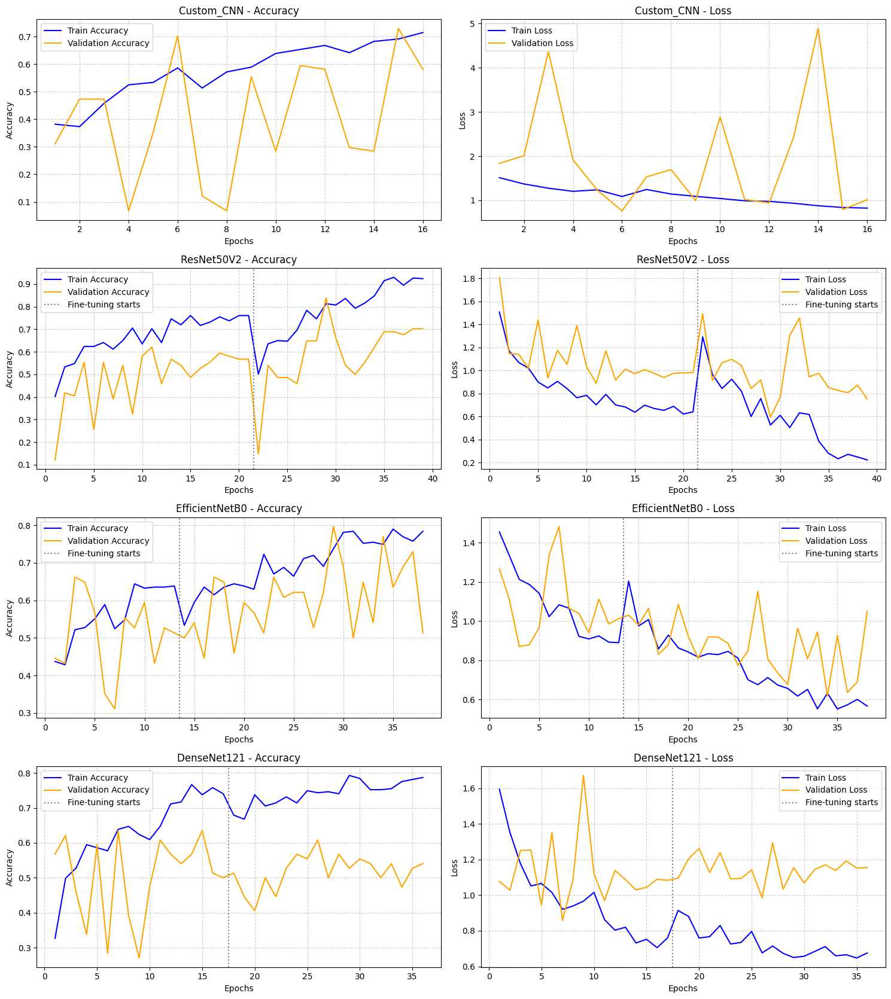

In [24]:
history_dict = json.loads(HISTORY_PATH.read_text()) if HISTORY_PATH.exists() else {}
arch_names = ['Custom_CNN', 'ResNet50V2', 'EfficientNetB0', 'DenseNet121']

if not history_dict:
    print("⚠️ No training history found. Skipping training history plots.")
else:
    fig, axes = plt.subplots(len(arch_names), 2, figsize=(15, 4.2 * len(arch_names)))

    for i, name in enumerate(arch_names):
        # Combine phase 1 and phase 2 histories
        h1 = history_dict.get(f'{name}_phase1', {})
        h2 = history_dict.get(f'{name}_phase2', {})
        n1 = len(h1.get('accuracy', []))

        for j, metric in enumerate(['accuracy', 'loss']):
            train_vals = h1.get(metric, []) + h2.get(metric, [])
            val_vals = h1.get(f'val_{metric}', []) + h2.get(f'val_{metric}', [])
            epochs = range(1, len(train_vals) + 1)
            ax = axes[i, j]
            ax.plot(epochs, train_vals, label=f'Train {metric.title()}', color='blue')
            ax.plot(epochs, val_vals, label=f'Validation {metric.title()}', color='orange')
            if h2:
                ax.axvline(n1 + 0.5, color='gray', linestyle=':', label='Fine-tuning starts')
            ax.set_title(f'{name} - {metric.title()}')
            ax.set_xlabel('Epochs')
            ax.set_ylabel(metric.title())
            ax.legend()
            ax.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.savefig(IMAGES_DIR / 'training_history.png', dpi=90, bbox_inches='tight')
    plt.show()

* **Fine-tuning shift:** after the dotted line, ResNet50V2's training loss drops sharply (0.64 → 0.22) and its validation accuracy climbs to 0.84. EfficientNetB0 shows a slower version of the same trend. DenseNet121's validation curves stay flat.
* **Custom CNN:** training accuracy rises steadily to ~0.71, but validation loss swings wildly (0.8 ↔ 4.9). A model trained from scratch on 343 images has not yet learned features that generalise.
* **Noisy validation curves for every model** are a consequence of the 74-image validation set, not of unstable training: the training curves are smooth.

### Model Comparison Table
Every checkpoint is scored on both the validation and the test set. **The best model is chosen on validation macro-F1** (ties broken by validation loss), not on test accuracy as in the lung notebook: choosing on the test set and then reporting the test score overstates how well the chosen model generalises. Macro-F1 is used because accuracy hides failures on the small Myocardial Infarction class.

In [25]:
results = []
val_probs, test_probs = {}, {}

print("Evaluating models on the validation and test sets...")
for name, model in loaded_models.items():
    val_probs[name] = model.predict(X_val_f, batch_size=16, verbose=0)

    start_time = time.time()
    test_probs[name] = model.predict(X_test_f, batch_size=16, verbose=0)
    eval_time = time.time() - start_time

    vp, tp = val_probs[name], test_probs[name]
    results.append({
        'Model': name,
        'Val Accuracy': accuracy_score(y_val, vp.argmax(1)),
        'Val Macro F1': f1_score(y_val, vp.argmax(1), average='macro'),
        'Val Loss': log_loss(y_val, vp, labels=range(num_classes)),
        'Test Accuracy': accuracy_score(y_test, tp.argmax(1)),
        'Test Macro F1': f1_score(y_test, tp.argmax(1), average='macro'),
        'Test Macro ROC-AUC': roc_auc_score(y_test, tp, multi_class='ovr', average='macro'),
        'Test Loss': log_loss(y_test, tp, labels=range(num_classes)),
        'Total Parameters': model.count_params(),
        'Eval Time (s)': round(eval_time, 2)
    })

df_results = pd.DataFrame(results)
df_results.to_csv(RESULTS_DIR / 'model_comparison.csv', index=False)

styled_df = (df_results.style
             .format({c: '{:.4f}' for c in df_results.columns if 'Accuracy' in c or 'F1' in c or 'AUC' in c or 'Loss' in c})
             .format({'Total Parameters': '{:,}'})
             .highlight_max(subset=['Val Accuracy', 'Val Macro F1', 'Test Accuracy', 'Test Macro F1', 'Test Macro ROC-AUC'], color='lightgreen')
             .highlight_min(subset=['Val Loss', 'Test Loss'], color='lightgreen'))
display(styled_df)

# Select on validation: highest macro-F1, then lowest loss
ranked = df_results.sort_values(['Val Macro F1', 'Val Loss'], ascending=[False, True])
best_model_name = ranked.iloc[0]['Model']
best_model = loaded_models[best_model_name]
print(f"\n🏆 Best Model (validation macro-F1, then validation loss): {best_model_name}")

Evaluating models on the validation and test sets...


,Model,Val Accuracy,Val Macro F1,Val Loss,Test Accuracy,Test Macro F1,Test Macro ROC-AUC,Test Loss,Total Parameters,Eval Time (s)
0,Custom_CNN,0.702703,0.394988,0.762630,0.689189,0.388168,0.853406,0.842700,"423,748",0.120000
1,ResNet50V2,0.621622,0.586324,0.887864,0.621622,0.589087,0.938077,0.877908,"24,090,372",0.290000
2,ResNet50V2_FT,0.837838,0.804701,0.594899,0.878378,0.850131,0.974600,0.372506,"24,090,372",0.290000
3,EfficientNetB0,0.662162,0.442321,0.870167,0.756757,0.550919,0.869023,0.882624,"4,378,535",0.350000
4,EfficientNetB0_FT,0.770270,0.684427,0.617634,0.837838,0.748864,0.920176,0.600512,"4,378,535",0.350000
5,DenseNet121,0.635135,0.511221,0.857464,0.662162,0.527567,0.931119,0.842731,"7,300,932",1.130000
6,DenseNet121_FT,0.608108,0.541330,0.985113,0.648649,0.596970,0.927125,0.961463,"7,300,932",1.240000



🏆 Best Model (validation macro-F1, then validation loss): ResNet50V2_FT


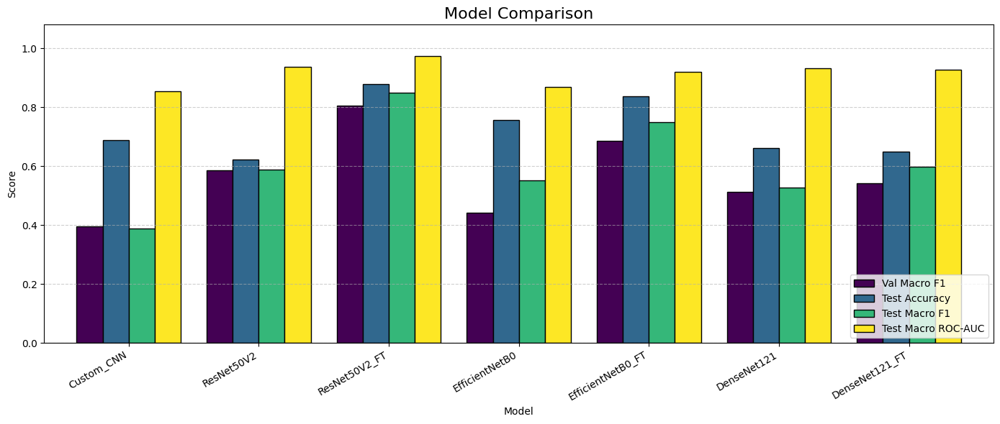

In [26]:
# Visual comparison
plot_df = df_results.set_index('Model')[['Val Macro F1', 'Test Accuracy', 'Test Macro F1', 'Test Macro ROC-AUC']]
ax = plot_df.plot(kind='bar', figsize=(14, 6), width=0.8, colormap='viridis', edgecolor='black')
ax.set_title('Model Comparison', fontsize=16)
ax.set_ylabel('Score')
ax.set_ylim(0, 1.08)
ax.set_xticklabels(plot_df.index, rotation=30, ha='right')
ax.legend(loc='lower right')
ax.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig(IMAGES_DIR / 'model_comparison.png', dpi=110, bbox_inches='tight')
plt.show()

**Observation on Model Comparison:**
* **ResNet50V2 (fine-tuned)** is the clear winner on validation (macro-F1 **0.805**, loss 0.60) and it holds up on the test set: **87.8% accuracy, 0.850 macro-F1, 0.975 macro ROC-AUC**.
* **EfficientNetB0 works this time.** Feeding it the 0–255 input it expects gives 0.838 test accuracy after fine-tuning, compared with 27% (chance level) in the lung notebook, where it received pre-divided pixels.
* **DenseNet121 underperforms** (≤ 0.66 test accuracy), and the **Custom CNN** gets 0.69 accuracy but only 0.39 macro-F1: it mostly predicts the two large classes.
* Fine-tuning helped both ResNet50V2 (+26 points test accuracy) and EfficientNetB0 (+8 points). The lung module's two-phase strategy holds up here too.

### How Precise Is the Test Score?
The test set holds only 74 ECGs (4 of them Myocardial Infarction), so one wrong prediction moves accuracy by 1.4 points. A bootstrap over the test images shows the resulting uncertainty.

In [27]:
rng = np.random.default_rng(SEED)
best_test_pred = test_probs[best_model_name].argmax(1)
boot_acc, boot_f1 = [], []
for _ in range(2000):
    idx = rng.integers(0, len(y_test), len(y_test))
    boot_acc.append(accuracy_score(y_test[idx], best_test_pred[idx]))
    boot_f1.append(f1_score(y_test[idx], best_test_pred[idx], average='macro', labels=range(num_classes), zero_division=0))

acc_ci = np.percentile(boot_acc, [2.5, 97.5])
f1_ci = np.percentile(boot_f1, [2.5, 97.5])
print(f"{best_model_name} on the test set (95% bootstrap CI):")
print(f"  Accuracy : {accuracy_score(y_test, best_test_pred):.3f}  [{acc_ci[0]:.3f}, {acc_ci[1]:.3f}]")
print(f"  Macro F1 : {f1_score(y_test, best_test_pred, average='macro'):.3f}  [{f1_ci[0]:.3f}, {f1_ci[1]:.3f}]")

ResNet50V2_FT on the test set (95% bootstrap CI):
  Accuracy : 0.878  [0.797, 0.946]
  Macro F1 : 0.850  [0.665, 0.947]


### Confusion Matrix + Classification Report

Generating predictions using ResNet50V2_FT...


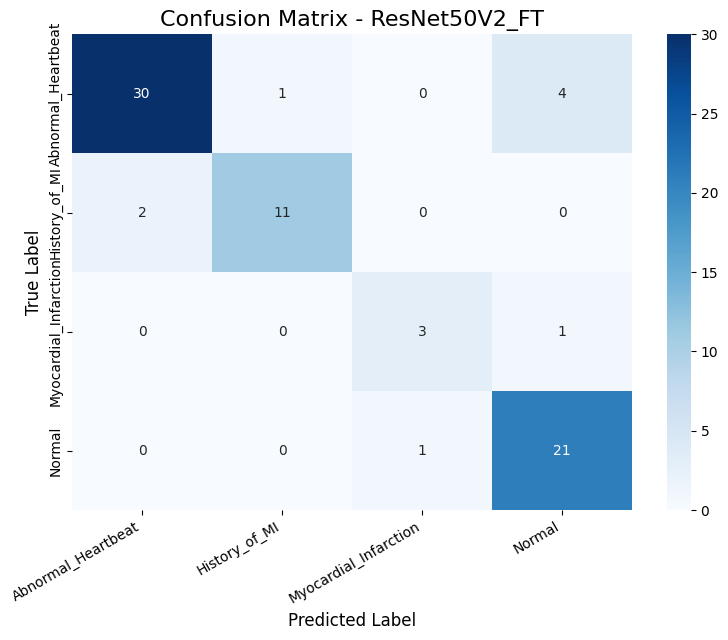


Classification Report:
                       precision    recall  f1-score   support

   Abnormal_Heartbeat      0.938     0.857     0.896        35
        History_of_MI      0.917     0.846     0.880        13
Myocardial_Infarction      0.750     0.750     0.750         4
               Normal      0.808     0.955     0.875        22

             accuracy                          0.878        74
            macro avg      0.853     0.852     0.850        74
         weighted avg      0.885     0.878     0.879        74



In [28]:
print(f"Generating predictions using {best_model_name}...")
Y_pred = test_probs[best_model_name]
y_pred = Y_pred.argmax(axis=1)
y_true = y_test

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred, labels=range(num_classes))
plt.figure(figsize=(8, 6.5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title(f'Confusion Matrix - {best_model_name}', fontsize=16)
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.savefig(IMAGES_DIR / 'confusion_matrix.png', dpi=120, bbox_inches='tight')
plt.show()

# Classification Report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=3, zero_division=0))
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True, zero_division=0)
pd.DataFrame(report).T.to_csv(RESULTS_DIR / 'classification_report.csv')

* **Strongest:** **Normal** is recognised almost perfectly (21 of 22, recall 0.95), and **Myocardial Infarction** has a single miss (3 of 4).
* **Weakest:** **Abnormal Heartbeat**, with 4 of 35 ECGs predicted as Normal. Some arrhythmias (occasional ectopic beats, mild rhythm irregularities) appear in only a few beats of a 10-second strip, and at 448×256 input a single abnormal beat is a small feature. Two History-of-MI ECGs are called Abnormal Heartbeat. Old infarcts leave subtle Q waves, so these two classes overlap.
* **No confusion between MI and History of MI:** acute ST elevation and an old, healed infarct look clearly different to the model.
* With only 4 MI test ECGs, its per-class scores (0.75 precision and recall) rest on four images. The bootstrap interval above (macro-F1 0.66–0.95) is the more honest summary.

### ROC-AUC Curves

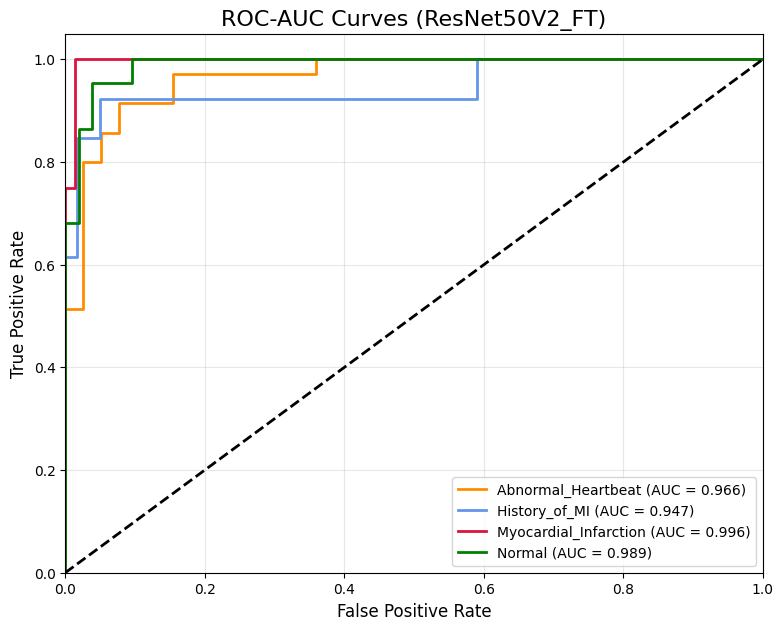

In [29]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels for one-vs-rest ROC
y_test_bin = label_binarize(y_true, classes=range(num_classes))

plt.figure(figsize=(9, 7))
colors = ['darkorange', 'cornflowerblue', 'crimson', 'green']

for i, color in zip(range(num_classes), colors):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], Y_pred[:, i])
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{class_names[i]} (AUC = {auc(fpr, tpr):0.3f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title(f'ROC-AUC Curves ({best_model_name})', fontsize=16)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.savefig(IMAGES_DIR / 'roc_auc_curves.png', dpi=120, bbox_inches='tight')
plt.show()

* All four classes have AUC ≥ 0.947: **Myocardial Infarction 0.996, Normal 0.989, Abnormal Heartbeat 0.966, History of MI 0.947**.
* The model *ranks* ECGs well even where its top-1 choice is wrong. Most errors come from borderline probabilities, not from confident mistakes, which the confidence check in the clinical pipeline can catch.

### Misclassified Examples

Total misclassified images: 9 out of 74


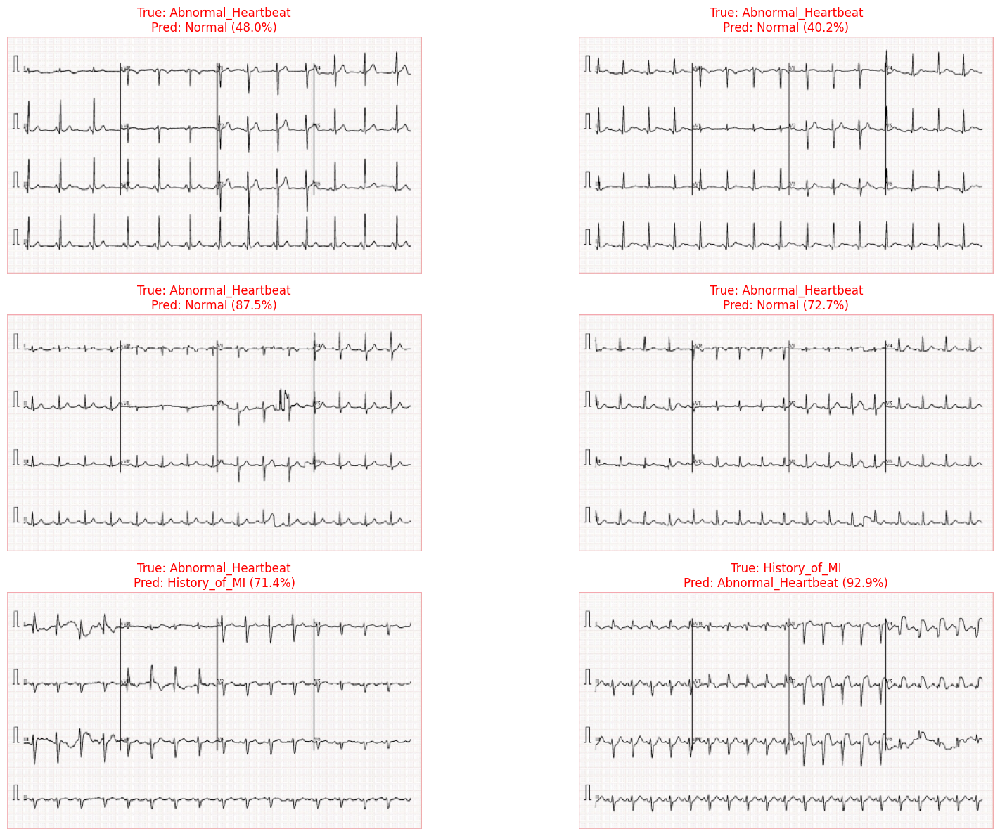

In [30]:
misclassified_idx = np.where(y_pred != y_true)[0]
print(f"Total misclassified images: {len(misclassified_idx)} out of {len(y_true)}")

num_to_show = min(6, len(misclassified_idx))
if num_to_show > 0:
    fig, axes = plt.subplots(int(np.ceil(num_to_show / 2)), 2, figsize=(18, 4 * np.ceil(num_to_show / 2)), squeeze=False)
    axes = axes.flatten()
    for i in range(num_to_show):
        idx = misclassified_idx[i]
        axes[i].imshow(X_test[idx])
        axes[i].set_title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]} "
                          f"({Y_pred[idx].max() * 100:.1f}%)", color='red')
        axes[i].axis('off')
    for ax in axes[num_to_show:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No misclassified images found.")

9 of 74 test ECGs are misclassified. The largest group is Abnormal Heartbeat called Normal (4 of the 9). On a downsampled printout these look like near-normal rhythm strips, with the abnormality confined to one or two beats.
* **7 of the 9 errors have a top-class probability below 75%** (between 40% and 73%), so the clinical pipeline would route them to manual review instead of reporting them.
* **2 are confident mistakes** that would pass the threshold: an Abnormal Heartbeat called Normal at 87.5%, and a History of MI called Abnormal Heartbeat at 92.9%. These are the cases the confidence check cannot catch.

# Explainability — Grad-CAM

### Explainability — Grad-CAM
Grad-CAM shows *where* the model looks. On an ECG printout the answer should be the **waveforms** (ST segments, Q waves, QRS complexes), not the pink grid, the lead labels, or the calibration pulses at the left edge, which are identical on every printout.

With the PyTorch backend the gradients come from `torch.autograd` instead of `tf.GradientTape`. The model is run layer by layer, and the feature map of the last convolutional stage is detached and marked as requiring gradients, so the head's gradient with respect to it can be taken even when the backbone is frozen.

In [31]:
import matplotlib

def gradcam_target_layer(model):
    """Backbone output for transfer models, last Conv2D for the Custom CNN."""
    backbone = get_backbone(model)
    return backbone if backbone is not None else [l for l in model.layers if isinstance(l, layers.Conv2D)][-1]


def make_gradcam_heatmap(img_array, model, pred_index=None):
    """img_array: (1, H, W, 3) float32 in 0-255. Returns (heatmap in [0, 1], class probabilities)."""
    target = gradcam_target_layer(model)
    x = keras.ops.convert_to_tensor(img_array)
    conv_outputs = None

    with torch.enable_grad():
        for layer in model.layers:
            if isinstance(layer, layers.InputLayer):
                continue
            x = layer(x, training=False)
            if layer is target:
                # Cut the graph here so gradients stop at the feature map
                conv_outputs = x.detach().requires_grad_(True)
                x = conv_outputs
        preds = x
        if pred_index is None:
            pred_index = int(torch.argmax(preds[0]))
        class_channel = preds[:, pred_index]
        grads = torch.autograd.grad(class_channel.sum(), conv_outputs)[0]

    # Average gradients spatially, then weight each channel by its importance
    pooled_grads = grads.mean(dim=(0, 1, 2))
    heatmap = (conv_outputs[0] @ pooled_grads[..., None]).squeeze(-1)

    # Keep positive influence only and normalize to [0, 1]
    heatmap = torch.relu(heatmap)
    heatmap = heatmap / (heatmap.max() + 1e-8)
    return heatmap.detach().cpu().numpy(), keras.ops.convert_to_numpy(preds[0])


print("Grad-CAM implementation ready.")

Grad-CAM implementation ready.


### Grad-CAM Heatmap Visualization

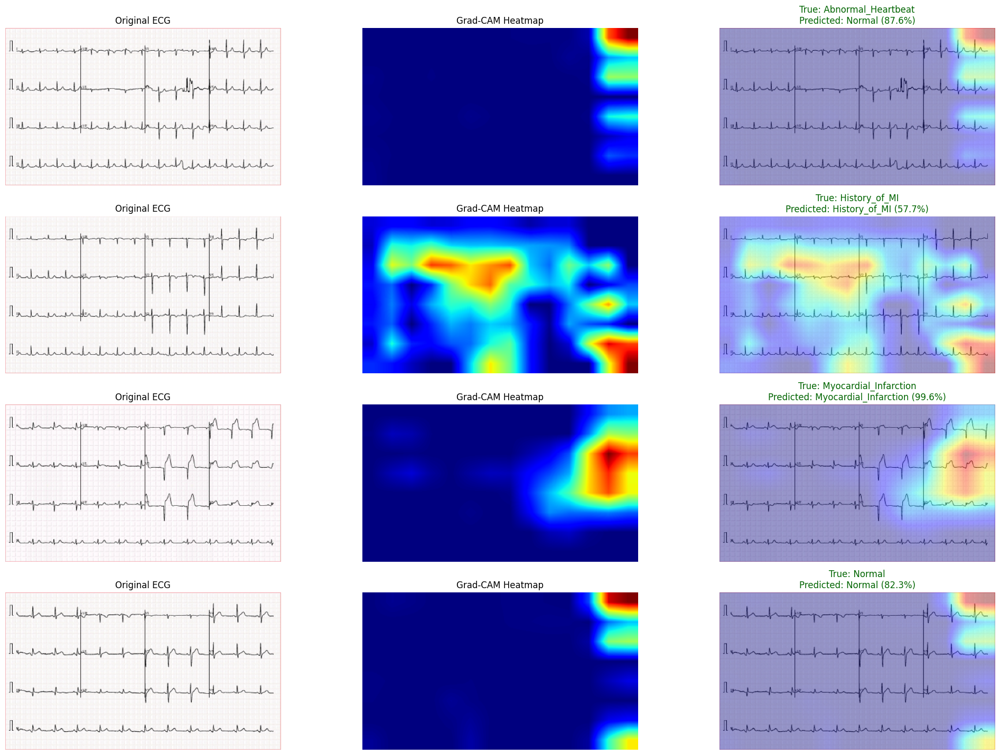

In [32]:
def display_gradcam(img, heatmap, ax_row, title="Grad-CAM"):
    """img: (H, W, 3) uint8/float 0-255."""
    img = np.asarray(img, dtype=np.uint8)
    h, w = img.shape[:2]
    heatmap_resized = cv2.resize(heatmap, (w, h))

    # Colorize the heatmap with the jet colormap and superimpose it
    jet_heatmap = matplotlib.colormaps['jet'](np.uint8(255 * heatmap_resized))[..., :3] * 255
    superimposed_img = np.clip(jet_heatmap * 0.4 + img * 0.6, 0, 255).astype(np.uint8)

    ax_row[0].imshow(img)
    ax_row[0].set_title("Original ECG")
    ax_row[0].axis('off')

    ax_row[1].imshow(heatmap_resized, cmap='jet')
    ax_row[1].set_title("Grad-CAM Heatmap")
    ax_row[1].axis('off')

    ax_row[2].imshow(superimposed_img)
    ax_row[2].set_title(title, color='darkgreen')
    ax_row[2].axis('off')
    return superimposed_img


# One random test ECG per class, explained by the best model
fig, axes = plt.subplots(num_classes, 3, figsize=(21, 3.6 * num_classes))

for i, class_name in enumerate(class_names):
    idx = random.choice(np.where(y_test == i)[0])
    img_array = X_test_f[idx:idx + 1]

    heatmap, probs = make_gradcam_heatmap(img_array, best_model)
    pred_idx = int(np.argmax(probs))

    title = f"True: {class_name}\nPredicted: {class_names[pred_idx]} ({probs[pred_idx] * 100:.1f}%)"
    display_gradcam(X_test[idx], heatmap, axes[i], title=title)

plt.tight_layout()
plt.savefig(IMAGES_DIR / 'gradcam_samples.png', dpi=80, bbox_inches='tight')
plt.show()

* **Myocardial Infarction (99.6%):** the heat is on the chest leads V4–V6 (right side, middle rows), where the grossly elevated ST segments are. These are the right features, the ones a cardiologist would point to.
* **History of MI:** the attention is spread over the second row (leads II, aVL, V2, where old-infarct Q waves and T-wave changes often appear) with a second spot at the bottom-right margin.
* **Normal / Abnormal Heartbeat:** the heat sits on the **right edge of the printout** (the last beats of V4–V6 and the grid border). Part of it covers real beats, but a hot spot at the page border suggests the model also uses something about the right margin. The border is part of the fixed template, so it should carry no information. **This is the main caveat of the module**. A larger dataset, or cropping each lead separately, would be needed to rule out such shortcuts.
* The last convolutional map of ResNet50V2 is only 8×14 cells for a 12-lead printout, so each cell covers about one lead-segment: good enough to see *which* lead, not *which* wave.

# Ensemble & Production Deployment

### Ensemble Predictions (Soft Voting)
The class probabilities of the three pre-trained architectures are averaged. For each architecture, the checkpoint (Phase 1 or fine-tuned) with the better validation macro-F1 is used.

In [33]:
ensemble_members = []
for arch in ['ResNet50V2', 'EfficientNetB0', 'DenseNet121']:
    candidates = df_results[df_results['Model'].isin([arch, f'{arch}_FT'])]
    candidates = candidates.sort_values(['Val Macro F1', 'Val Loss'], ascending=[False, True])
    ensemble_members.append(candidates.iloc[0]['Model'])
print(f"Ensemble members: {ensemble_members}")

# Average the predictions (Soft Voting)
ensemble_val = np.mean([val_probs[m] for m in ensemble_members], axis=0)
ensemble_preds = np.mean([test_probs[m] for m in ensemble_members], axis=0)
ensemble_classes = ensemble_preds.argmax(axis=1)

print("\n🌟 Ensemble Classification Report 🌟")
print(classification_report(y_test, ensemble_classes, target_names=class_names, digits=3, zero_division=0))

ensemble_metrics = {
    'val_macro_f1': f1_score(y_val, ensemble_val.argmax(1), average='macro'),
    'accuracy': accuracy_score(y_test, ensemble_classes),
    'macro_f1': f1_score(y_test, ensemble_classes, average='macro'),
    'macro_roc_auc': roc_auc_score(y_test, ensemble_preds, multi_class='ovr', average='macro'),
    'log_loss': log_loss(y_test, ensemble_preds, labels=range(num_classes))
}
best_row = df_results.set_index('Model').loc[best_model_name]
print(f"Ensemble      -> val macro-F1 {ensemble_metrics['val_macro_f1']:.4f} | test acc {ensemble_metrics['accuracy']:.4f} | "
      f"test macro-F1 {ensemble_metrics['macro_f1']:.4f} | log-loss {ensemble_metrics['log_loss']:.4f}")
print(f"{best_model_name:13s} -> val macro-F1 {best_row['Val Macro F1']:.4f} | test acc {best_row['Test Accuracy']:.4f} | "
      f"test macro-F1 {best_row['Test Macro F1']:.4f} | log-loss {best_row['Test Loss']:.4f}")

Ensemble members: ['ResNet50V2_FT', 'EfficientNetB0_FT', 'DenseNet121_FT']

🌟 Ensemble Classification Report 🌟
                       precision    recall  f1-score   support

   Abnormal_Heartbeat      0.938     0.857     0.896        35
        History_of_MI      0.917     0.846     0.880        13
Myocardial_Infarction      0.800     1.000     0.889         4
               Normal      0.840     0.955     0.894        22

             accuracy                          0.892        74
            macro avg      0.874     0.914     0.890        74
         weighted avg      0.897     0.892     0.892        74

Ensemble      -> val macro-F1 0.7954 | test acc 0.8919 | test macro-F1 0.8895 | log-loss 0.5266
ResNet50V2_FT -> val macro-F1 0.8047 | test acc 0.8784 | test macro-F1 0.8501 | log-loss 0.3725


* **Ensemble on the test set:** soft voting over ResNet50V2_FT, EfficientNetB0_FT and DenseNet121_FT scores **89.2% accuracy / 0.890 macro-F1**, catching all 4 MI ECGs.
* **But it is not selected.** On the validation set the ensemble is slightly *worse* than ResNet50V2_FT alone (macro-F1 0.795 vs 0.805), and its test log-loss is higher (0.53 vs 0.37), because averaging with the weaker DenseNet121 flattens the probabilities. A one-image difference on the test set (1.4 points) is within noise, and choosing the ensemble because of its test score would be test-set selection. The single ResNet50V2_FT stays the deployed model, with better-calibrated probabilities for the confidence check.

### Custom Inference Function for Production
`ecg_predict(image_path)` wraps the whole path `load → crop → resize → predict → explain`. It accepts a full uncropped printout as well as an already cropped ECG, so it can be called directly from an API (FastAPI / Streamlit).

In [34]:
def ecg_predict(image_path, model=best_model, show=True):
    """End-to-end inference for one ECG image: prediction, confidence, Grad-CAM heatmap."""
    img = load_image(image_path)
    heatmap, probs = make_gradcam_heatmap(img[None], model)
    pred_idx = int(np.argmax(probs))
    predicted_class, confidence = class_names[pred_idx], float(probs[pred_idx] * 100)

    print(f"🫀 Predicted Condition: {predicted_class}")
    print(f"📊 Confidence: {confidence:.2f}%")

    if show:
        fig, axes_row = plt.subplots(1, 3, figsize=(21, 4))
        display_gradcam(img, heatmap, axes_row, title=f"{predicted_class} ({confidence:.1f}%)")
        plt.show()

    return {"prediction": predicted_class, "confidence": confidence, "heatmap": heatmap}

# Final Best Model Summary

* **Best model:** ResNet50V2 (fine-tuned), selected on validation macro-F1
* **Input:** 12-lead printout cropped to the ECG grid, resized to 448×256 (RGB, 0–255, scaled inside the model)
* **Classes:** Abnormal Heartbeat, History of MI, Myocardial Infarction, Normal
* **Data:** 491 unique ECGs after removing 437 duplicates; stratified split Train 343 | Val 74 | Test 74
* **Class imbalance handling:** balanced class weights (MI × 4.08) + ECG-safe augmentation (no flips)
* **Test metrics:** 87.8% accuracy (95% CI 79.7–94.6%), 0.850 macro-F1 (CI 0.66–0.95), 0.975 macro ROC-AUC
* **Explainability:** Grad-CAM heatmaps (MI attention on the ST-elevated chest leads; right-margin attention for Normal is a flagged caveat)
* **Reliability layer:** kNN OOD gate (0% of real ECGs rejected, 100% of noise / blank pages / X-rays / charts rejected) + 75% confidence threshold

# Mock Test

Testing Production Function on True Class: Normal
--------------------------------------------------
🫀 Predicted Condition: Normal
📊 Confidence: 73.07%


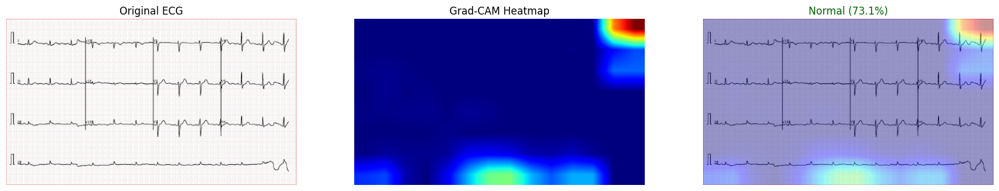

In [35]:
# Pick a random ECG from the test set
test_class = random.choice(class_names)
test_img_name = random.choice(os.listdir(test_dir / test_class))
test_img_path = test_dir / test_class / test_img_name

print(f"Testing Production Function on True Class: {test_class}\n{'-' * 50}")
result = ecg_predict(test_img_path)

# Clinical Safety & Out-of-Distribution (OOD) Detection

### Cascaded Heart ECG AI Pipeline

The classifier assumes every input is a 12-lead ECG printout. Given a chest X-ray, a photo or random noise it will still confidently name a heart condition. A 4-stage cascade guards against this:

| Stage | What | Outcome |
|---|---|---|
| **1. Input validity (OOD gate)** | Distance from the best model's embedding to its nearest training ECGs | Not an ECG → **Rejected** |
| **2. Classification** | Best model | Probabilities for the 4 classes |
| **3. Confidence check** | Top-class probability < threshold | **Low Confidence – Manual Review** |
| **4. Explainability** | Grad-CAM on the top class + top-3 differential | Heatmap and overlay for the cardiologist |

```
ECG image ─► [1] OOD gate ──reject──► "Not an ECG printout"
                  │ pass
                  ▼
             [2] Classifier ─► [3] confidence ≥ threshold? ──no──► "Manual review"
                                        │ yes
                                        ▼
                                  [4] Grad-CAM + top-3 ─► report
```

In [36]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import NearestNeighbors
import joblib

print("Setting up Out-of-Distribution (OOD) Detectors...")

# Embeddings = output of the GlobalAveragePooling layer of the best model
feature_extractor = keras.Model(inputs=best_model.inputs, outputs=best_model.get_layer('gap').output)


def embed(X, extractor=feature_extractor):
    return keras.ops.convert_to_numpy(extractor.predict(np.asarray(X, dtype='float32'), batch_size=16, verbose=0))


print("Extracting training embeddings for the OOD baseline (all training ECGs, no augmentation)...")
train_embeddings = embed(X_train)

# A. Isolation Forest - the lung module's gate. Contamination assumes ~1% of training ECGs are unusual scans
iso_forest = IsolationForest(n_estimators=200, contamination=0.01, random_state=SEED).fit(train_embeddings)

# B. k-nearest-neighbour gate: mean cosine distance to the 5 closest training ECGs.
#    Threshold = 99th percentile of the same score for each training ECG against the others (leave-one-out).
OOD_K = 5
unit = lambda E: E / np.linalg.norm(E, axis=1, keepdims=True)
knn_index = NearestNeighbors(n_neighbors=OOD_K + 1).fit(unit(train_embeddings))
loo_scores = knn_index.kneighbors(unit(train_embeddings))[0][:, 1:].mean(1)   # column 0 is the point itself
knn_gate = {'index': knn_index, 'k': OOD_K, 'threshold': float(np.percentile(loo_scores, 99))}


def knn_ood_score(emb, gate=None):
    gate = gate or knn_gate
    return gate['index'].kneighbors(unit(emb), n_neighbors=gate['k'])[0].mean(1)


def is_ood(emb, gate=None):
    # True = rejected
    gate = gate or knn_gate
    return knn_ood_score(emb, gate) > gate['threshold']


print(f"✅ Both gates fitted on {len(train_embeddings)} ECG embeddings ({train_embeddings.shape[1]} dims). "
      f"kNN threshold = {knn_gate['threshold']:.4f}")

Setting up Out-of-Distribution (OOD) Detectors...
Extracting training embeddings for the OOD baseline (all training ECGs, no augmentation)...


✅ Both gates fitted on 343 ECG embeddings (2048 dims). kNN threshold = 0.4630


### Validating the OOD Gate
A gate is only useful if it passes real ECGs and rejects everything else. Both gates are checked on held-out ECGs and on inputs that must be rejected: random noise, blank pages, grey speckle on a white page, real **chest X-rays** from the lung module's dataset (the most likely wrong upload in this multi-organ project), and charts from the heart tabular module (line drawings on a white background, the closest thing to an ECG).

In [37]:
rng = np.random.default_rng(SEED)
ood_sets = {
    'Validation ECGs': X_val_f,
    'Test ECGs': X_test_f,
    'Random noise': rng.integers(0, 256, (50,) + INPUT_SHAPE).astype('float32'),
    'Blank white page': np.full((10,) + INPUT_SHAPE, 255, dtype='float32'),
    'Grey speckle on white': np.clip(255 - np.abs(rng.normal(0, 60, (20,) + IMG_SIZE + (1,))), 0, 255).repeat(3, -1).astype('float32'),
}

# Chest X-rays from the lung dataset, if it is on this machine
xray_root = Path('E:/Lung_Xray/test')
if xray_root.exists():
    xray_paths = [p for p in xray_root.rglob('*') if p.suffix.lower() in ('.png', '.jpg', '.jpeg')]
    xray_paths = random.Random(SEED).sample(xray_paths, min(60, len(xray_paths)))
    ood_sets['Chest X-rays (lung dataset)'] = np.stack([load_image(p) for p in xray_paths])

# Plots from the heart tabular module
chart_paths = sorted(Path('../../tabular/images').glob('*.png'))
if chart_paths:
    ood_sets['Charts (heart tabular plots)'] = np.stack([load_image(p) for p in chart_paths])

rows = []
for set_name, X in ood_sets.items():
    emb = embed(X)
    rows.append({'Input set': set_name, 'Images': len(X),
                 'Isolation Forest rejected %': round(100 * (iso_forest.predict(emb) == -1).mean(), 1),
                 'kNN gate rejected %': round(100 * is_ood(emb).mean(), 1)})
ood_report = pd.DataFrame(rows)
display(ood_report)

# Deploy the kNN gate
joblib.dump(knn_gate, MODELS_DIR / 'heart_ecg_ood_detector.joblib')
print("Saved the kNN gate to models/heart_ecg_ood_detector.joblib")

,Input set,Images,Isolation Forest rejected %,kNN gate rejected %
0,Validation ECGs,74,1.4,0.0
1,Test ECGs,74,1.4,0.0
2,Random noise,50,0.0,100.0
3,Blank white page,10,0.0,100.0
4,Grey speckle on white,20,0.0,100.0
5,Chest X-rays (lung dataset),60,100.0,100.0
6,Charts (heart tabular plots),15,80.0,100.0


Saved the kNN gate to models/heart_ecg_ood_detector.joblib


* **The lung module's Isolation Forest fails here.** It rejects every chest X-ray, but lets **100% of random noise, blank pages and grey speckle through**, and 20% of the charts. The fine-tuned ResNet50V2 embeds these featureless images near the middle of the ECG cloud, and an Isolation Forest that splits single features at random cannot isolate points that sit inside every feature's normal range.
* **The kNN gate works:** it measures how far an image is from its nearest *real* ECGs in cosine distance. It rejects **0%** of held-out ECGs and **100%** of every non-ECG set, including the line charts, the hardest case.
* The deployed gate (`models/heart_ecg_ood_detector.joblib`) is therefore the kNN one. The threshold is the 99th percentile of the training ECGs' own leave-one-out scores, so about 1% of genuine but unusual ECGs are expected to be rejected in use.

### Choosing the Confidence Threshold
The threshold is set on the **validation** set: for each candidate, what share of ECGs is accepted automatically (coverage), and how accurate are the accepted and the flagged ones?

In [38]:
val_best = val_probs[best_model_name]
val_conf, val_correct = val_best.max(1), val_best.argmax(1) == y_val

rows = []
for t in [0.5, 0.6, 0.7, 0.75, 0.8, 0.9, 0.95]:
    accepted = val_conf >= t
    rows.append({'Threshold': t,
                 'Coverage': accepted.mean(),
                 'Accuracy (accepted)': val_correct[accepted].mean() if accepted.any() else np.nan,
                 'Flagged': int((~accepted).sum()),
                 'Accuracy (flagged)': val_correct[~accepted].mean() if (~accepted).any() else np.nan})
display(pd.DataFrame(rows).round(3))

,Threshold,Coverage,Accuracy (accepted),Flagged,Accuracy (flagged)
0,0.50,0.973,0.847,2,0.500
1,0.60,0.851,0.873,11,0.636
2,0.70,0.757,0.893,18,0.667
3,0.75,0.716,0.906,21,0.667
4,0.80,0.649,0.938,26,0.654
5,0.90,0.568,0.929,32,0.719
6,0.95,0.446,0.909,41,0.780


In [39]:
CONFIDENCE_THRESHOLD = 0.75   # same default as the lung module

test_conf = Y_pred.max(1)
test_accepted = test_conf >= CONFIDENCE_THRESHOLD
test_correct = Y_pred.argmax(1) == y_test
confidence_coverage = {
    'threshold': CONFIDENCE_THRESHOLD,
    'coverage': float(test_accepted.mean()),
    'accuracy_accepted': float(test_correct[test_accepted].mean()) if test_accepted.any() else None,
    'accuracy_flagged': float(test_correct[~test_accepted].mean()) if (~test_accepted).any() else None,
}
print(f"Test set at threshold {CONFIDENCE_THRESHOLD}: {confidence_coverage}")

Test set at threshold 0.75: {'threshold': 0.75, 'coverage': 0.7162162162162162, 'accuracy_accepted': 0.9622641509433962, 'accuracy_flagged': 0.6666666666666666}


* On validation, **0.75** accepts 72% of ECGs automatically with 90.6% accuracy, while the flagged 28% are only 66.7% correct. The threshold separates reliable predictions from shaky ones, so the lung module's default is kept.
* On the **test** set the same threshold accepts **71.6%** of ECGs, and those are **96.2%** correct. The 28% sent to review are 66.7% correct. In practice, a cardiologist would look at roughly one ECG in four, and the automatic reports would be right about 24 times out of 25.
* A stricter 0.80 buys little extra accuracy (93.8% on validation) for a 7-point loss in coverage.

### Clinical-style Final Function

In [40]:
def predict_heart_ecg(image_path, model=best_model, extractor=feature_extractor, gate=knn_gate,
                      threshold=CONFIDENCE_THRESHOLD * 100, show=True):
    print(f"\n{'=' * 60}")
    print(f"🫀 CLINICAL AI PIPELINE REPORT")
    print(f"File: {os.path.basename(str(image_path))}")
    print(f"{'=' * 60}")

    # Load and Preprocess
    try:
        img = load_image(image_path)
    except Exception as e:
        print(f"❌ ERROR: Failed to load image. {e}")
        return {'status': 'Error', 'error': str(e)}
    img_array = img[None]

    # Stage 1: Input Validity (OOD Check)
    if is_ood(embed(img_array, extractor), gate)[0]:
        print("🚨 [STAGE 1] OUT-OF-DISTRIBUTION DETECTED")
        print("   Status: REJECTED")
        print("   Reason: This image does not match the embedding space of 12-lead ECG printouts.")
        print("   Action: Please upload a valid, properly scanned 12-lead ECG.\n")
        return {'status': 'Rejected - Not an ECG', 'anomaly_flagged': True}   # halt pipeline
    print("✅ [STAGE 1] Input Validation: PASSED (In-distribution)")

    # Stage 2: Disease Classification (+ Stage 4 heatmap from the same forward pass)
    heatmap, preds = make_gradcam_heatmap(img_array, model)
    top_3_indices = np.argsort(preds)[-3:][::-1]
    top_3 = [(class_names[i], float(preds[i] * 100)) for i in top_3_indices]
    primary_pred, primary_conf = top_3[0]
    print(f"\n🔬 [STAGE 2] Primary Finding: {primary_pred}")

    # Stage 3: Confidence Check
    if primary_conf < threshold:
        print(f"⚠️ [STAGE 3] Confidence: {primary_conf:.2f}% (Below {threshold:.0f}% threshold)")
        print("   Status: LOW CONFIDENCE - FLAG FOR MANUAL REVIEW")
        status = 'Low Confidence - Manual Review'
    else:
        print(f"✅ [STAGE 3] Confidence: {primary_conf:.2f}%")
        print("   Status: ACCEPTED")
        status = 'Accepted'

    print("\n📊 Top-3 Probabilities:")
    for cls, prob in top_3:
        print(f"   - {cls:22s}: {prob:.2f}%")

    # Stage 4: Explainability
    print("\n🧠 [STAGE 4] Explainability Map (Grad-CAM) generated.")
    overlay = None
    if show:
        fig, axes_row = plt.subplots(1, 3, figsize=(21, 4))
        overlay = display_gradcam(img, heatmap, axes_row, title=f"Pred: {primary_pred} ({primary_conf:.1f}%)\nStatus: {status}")
        plt.show()

    return {'status': status, 'anomaly_flagged': False, 'prediction': primary_pred,
            'confidence': primary_conf / 100, 'probabilities': dict(zip(class_names, map(float, preds))),
            'top_3': top_3, 'heatmap': heatmap, 'overlay': overlay}

### Testing the Pipeline
The pipeline is run on a real test ECG, a random-noise image, and a chest X-ray, to see the OOD gate in action.

Testing on a valid ECG from the test set (Normal):

🫀 CLINICAL AI PIPELINE REPORT
File: Normal(87).png
✅ [STAGE 1] Input Validation: PASSED (In-distribution)

🔬 [STAGE 2] Primary Finding: Myocardial_Infarction
⚠️ [STAGE 3] Confidence: 65.66% (Below 75% threshold)
   Status: LOW CONFIDENCE - FLAG FOR MANUAL REVIEW

📊 Top-3 Probabilities:
   - Myocardial_Infarction : 65.66%
   - Normal                : 33.52%
   - History_of_MI         : 0.64%

🧠 [STAGE 4] Explainability Map (Grad-CAM) generated.


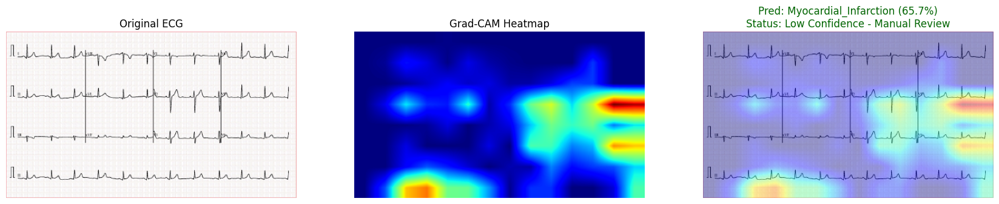



Testing on an invalid image (Random Noise):

🫀 CLINICAL AI PIPELINE REPORT
File: tmpbc4bpdn5.png
🚨 [STAGE 1] OUT-OF-DISTRIBUTION DETECTED
   Status: REJECTED
   Reason: This image does not match the embedding space of 12-lead ECG printouts.
   Action: Please upload a valid, properly scanned 12-lead ECG.



Testing on a chest X-ray (wrong modality):

🫀 CLINICAL AI PIPELINE REPORT
File: Pneumonia-Viral (897).jpg
🚨 [STAGE 1] OUT-OF-DISTRIBUTION DETECTED
   Status: REJECTED
   Reason: This image does not match the embedding space of 12-lead ECG printouts.
   Action: Please upload a valid, properly scanned 12-lead ECG.



In [41]:
import tempfile

# 1. A valid ECG from the test set
test_class = random.choice(class_names)
test_img_path = test_dir / test_class / random.choice(os.listdir(test_dir / test_class))
print(f"Testing on a valid ECG from the test set ({test_class}):")
_ = predict_heart_ecg(test_img_path)

# 2. An invalid input: random RGB noise
print("\n\nTesting on an invalid image (Random Noise):")
noise_arr = np.random.randint(0, 256, (617, 1054, 3), dtype=np.uint8)
with tempfile.NamedTemporaryFile(suffix='.png', delete=False) as temp_file:
    noise_img_path = temp_file.name
Image.fromarray(noise_arr).save(noise_img_path)
_ = predict_heart_ecg(noise_img_path)
os.remove(noise_img_path)

# 3. The wrong organ: a chest X-ray
if xray_root.exists():
    print("\n\nTesting on a chest X-ray (wrong modality):")
    _ = predict_heart_ecg(xray_paths[0])

### Save Deployment Metadata
Everything a serving script needs besides the `.keras` file: class order, preprocessing, crop box, the chosen model, the threshold, and the measured test metrics.

In [42]:
best_test = df_results.set_index('Model').loc[best_model_name]
metadata = {
    'class_names': class_names,
    'img_size': list(IMG_SIZE),
    'preprocessing': 'RGB; crop 2213x1572 printouts to GRID_BOX; resize to 448x256 (BOX); float 0-255 - each model rescales internally',
    'printout_size': list(PRINTOUT_SIZE),
    'grid_box': list(GRID_BOX),
    'best_model': best_model_name,
    'selection': 'highest validation macro-F1, then lowest validation loss',
    'ensemble_members': ensemble_members,
    'confidence_threshold': CONFIDENCE_THRESHOLD,
    'test_metrics': {
        'accuracy': float(best_test['Test Accuracy']),
        'macro_f1': float(best_test['Test Macro F1']),
        'macro_roc_auc': float(best_test['Test Macro ROC-AUC']),
        'log_loss': float(best_test['Test Loss']),
        'accuracy_95ci': [float(v) for v in acc_ci],
        'macro_f1_95ci': [float(v) for v in f1_ci],
    },
    'ensemble_test_metrics': {k: float(v) for k, v in ensemble_metrics.items()},
    'confidence_coverage': confidence_coverage,
    'ood_gate': {'method': f"mean cosine distance to {knn_gate['k']} nearest training embeddings",
                 'threshold': knn_gate['threshold'],
                 'rejected': {row['Input set']: row['kNN gate rejected %'] / 100 for _, row in ood_report.iterrows()}},
    'dataset': {'unique_ecgs': int(len(manifest)), 'train': int(len(X_train)), 'val': int(len(X_val)), 'test': int(len(X_test))},
}
(MODELS_DIR / 'metadata.json').write_text(json.dumps(metadata, indent=2))
print(json.dumps(metadata, indent=2))

{
  "class_names": [
    "Abnormal_Heartbeat",
    "History_of_MI",
    "Myocardial_Infarction",
    "Normal"
  ],
  "img_size": [
    256,
    448
  ],
  "preprocessing": "RGB; crop 2213x1572 printouts to GRID_BOX; resize to 448x256 (BOX); float 0-255 - each model rescales internally",
  "printout_size": [
    2213,
    1572
  ],
  "grid_box": [
    68,
    283,
    2177,
    1518
  ],
  "best_model": "ResNet50V2_FT",
  "selection": "highest validation macro-F1, then lowest validation loss",
  "ensemble_members": [
    "ResNet50V2_FT",
    "EfficientNetB0_FT",
    "DenseNet121_FT"
  ],
  "confidence_threshold": 0.75,
  "test_metrics": {
    "accuracy": 0.8783783783783784,
    "macro_f1": 0.8501305970149253,
    "macro_roc_auc": 0.9746004678381728,
    "log_loss": 0.3725057825207516,
    "accuracy_95ci": [
      0.7972972972972973,
      0.9459459459459459
    ],
    "macro_f1_95ci": [
      0.6646404964030398,
      0.9471865351629503
    ]
  },
  "ensemble_test_metrics": {
    "val_m

# Conclusion
This project built an interpretable, safety-gated computer-vision pipeline that classifies 12-lead ECG printouts into four cardiac categories. It mirrors the lung X-ray module, but the data needed far more care: the published dataset turned out to be half duplicates.

**Key Achievements & Methodologies:**
* **Data Integrity First:** Found and removed 437 exact duplicate files (47% of the dataset; 209 of the 239 Myocardial Infarction files), which would otherwise have leaked copies of the same ECG into both train and test. Cropped away the printout header (patient ID, date, heart rate) so the models can only use the waveforms.
* **Preprocessing & Augmentation:** Aspect-preserving 448×256 input with area resampling for thin traces, ECG-safe augmentation (no flips), and balanced class weights for the 8:1 class imbalance.
* **Model Optimization:** Compared a Custom CNN with ImageNet-pretrained ResNet50V2, EfficientNetB0 and DenseNet121 under the two-phase strategy, giving each backbone the input scaling it expects. That fixed the EfficientNetB0 failure seen in the lung module. **ResNet50V2 (fine-tuned)** was selected on validation and scored **87.8% accuracy, 0.850 macro-F1 and 0.975 macro ROC-AUC** on the held-out test set.
* **Honest Evaluation:** Model selection on validation only, bootstrap confidence intervals on the 74-image test set, and an ensemble that was reported but not deployed, because its test-set advantage did not show on validation.
* **Visual Explainability (Grad-CAM):** A PyTorch-autograd Grad-CAM shows MI predictions focused on the ST-elevated chest leads. It also shows right-margin attention for some Normal predictions, which is reported as a caveat rather than hidden.
* **Cascaded Clinical Safety Pipeline:**
  1. **Input Validation (OOD Detection):** a kNN gate on model embeddings. The lung module's Isolation Forest was tested first and let every noise and blank-page image through. The kNN gate rejected 100% of noise, blank pages, chest X-rays and charts and 0% of real ECGs.
  2. **Disease Classification:** top-3 differential for the cardiologist.
  3. **Confidence Thresholding:** at 75%, 72% of test ECGs are reported automatically with 96% accuracy; the rest go to manual review.
  4. **Explainability:** a Grad-CAM overlay is attached to every accepted report.

**Limitations:**
* **Small data:** after de-duplication there are only 30 distinct Myocardial Infarction ECGs (4 in the test set), so per-class MI metrics are indicative only. The 95% interval for macro-F1 is 0.66–0.95.
* **Single source:** all ECGs come from one hospital and one ECG machine template. Performance on other printers, paper speeds or photographed ECGs is unknown, and such images may also be rejected by the OOD gate.
* **Possible shortcut:** the right-margin Grad-CAM attention for Normal ECGs needs to be ruled out before any clinical use.

**Future Work / Next Steps:**
* **More data:** add a larger, multi-source ECG image set, for example ECG images rendered from PTB-XL (21,799 ECGs), which would also allow a proper MI test set.
* **Lead-level modelling:** crop the 12 leads into separate strips (or digitise them back into signals) so the model sees each lead at full resolution, and so Grad-CAM can point to individual waves.
* **Clinical UI Integration:** wrap `predict_heart_ecg` into the project's Streamlit/FastAPI front end next to the lung module's `predict_lung_xray`.